Steps of training an LLM

**STAGE 1**


1.   Data Prepration and sampling
2.   Attention Mechanism
3.   LLM Architecture



**1.1 Data Prepration and Sampling**

*Deep Neural networks, including LLMs, cannot process raw text directly. Since text is categorical, it isn't compatible with the mathematical operations used to implement and train neural networks. THerefore, we need a way to represent words as a continous-valued vectors.*

**1.1.1 Tokenizing Text**

Here, we split an input text into individual tokens, which are either words or special characters, such as punctuation characters. In upcoming sections, we will convert the text into token IDs and create token embeddings.

In [ ]:
with open('the-verdict.txt', 'r', encoding='utf-8') as f:
    raw_text = f.read()
print("Total number of characters:", len(raw_text))
print(raw_text[:49])


Total number of characters: 20479
I HAD always thought Jack Gisburn rather a cheap 


Now our goal is to tokenize this 20479 character short story into individual words and special characters that we can then turn into embeddings for LLM training

**1.1.1.1 How can we best split this text to obtain a list of tokens**

In [ ]:
#Example 1
import re
text = "Hello, world. This, is a test."
result = re.split(r'(\s)', text)
print(result)

['Hello,', ' ', 'world.', ' ', 'This,', ' ', 'is', ' ', 'a', ' ', 'test.']


The above method works for splitting the sentence into individual words, however, some words are still conected to punctuation characters that we want to have as a separate list of entries. We also refrain from making all text lowercase because capitalization helps LLms distinguish between proper nouns and common nouns understand sentence structure, and learn to generate text with proper capitilization.

In [ ]:
#Example 2
result = re.split(r'([,.]|\s)', text)
print(result)

['Hello', ',', '', ' ', 'world', '.', '', ' ', 'This', ',', '', ' ', 'is', ' ', 'a', ' ', 'test', '.', '']


Now a small issue remianing is that the list still includes whitespace characters. Optionally, we can remove these redundant characters safely as follows.

In [ ]:
#Example 3
#With whitespaces removed
result = [item for item in result if item.strip()]
print(result)

['Hello', ',', 'world', '.', 'This', ',', 'is', 'a', 'test', '.']


**To Keep or not to Keep whitespaces:** *When developing a simple tokenizer, whether we should encode whitespaces as separate characters or just remove them depends on our application and its requirements. Removing whitespaces reduces the memory and computing
requirements. However, keeping whitespaces can be useful if we train models
that are sensitive to the exact structure of the text (for example, Python code,
which is sensitive to indentation and spacing). Here, we remove whitespaces
for simplicity and brevity of the tokenized outputs. Later, we will switch to a
tokenization scheme that includes whitespaces.*

We have a good tokenizer now but we still need to handle some more punctuation marsks

In [ ]:
#Final
text = "Hello, world. This, is it-- a test."
result = re.split(r'([,.:?;_!"()\']|--|\s)', text)
result = [item.strip() for item in result if item.strip()]
print(result)

['Hello', ',', 'world', '.', 'This', ',', 'is', 'it', '--', 'a', 'test', '.']


Now this tokenization scheme splits text into individual words and puncuation charactesr.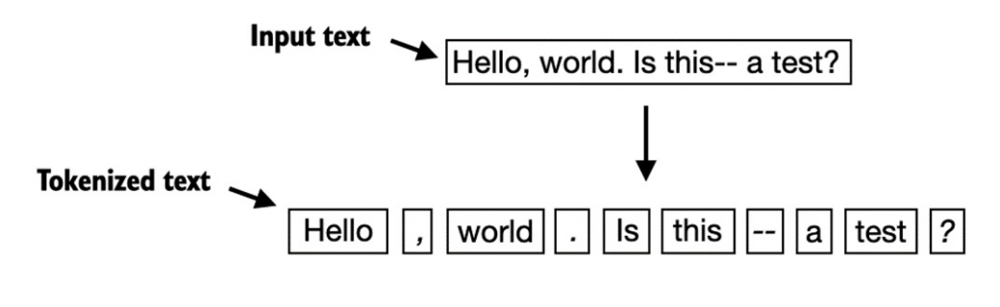

Let's apply it to our story

In [ ]:
preprocessed = re.split(r'([,.:?;_!"()\']|--|\s)', raw_text)
preprocessed = [item.strip() for item in preprocessed if item.strip()]
print(len(preprocessed))

4690


This 4690 is the number of tokens in this text(without whitespaces)

In [ ]:
print(preprocessed[:9])

['I', 'HAD', 'always', 'thought', 'Jack', 'Gisburn', 'rather', 'a', 'cheap']


**1.1.2 Converting tokens into token IDs**

*In the previous section, we tokenized a short story by Edith Wharton into
individual tokens. In this section, we will convert these tokens from a Python
string to an integer representation to produce the so-called token IDs. This
conversion is an intermediate step before converting the token IDs into
embedding vectors. To map the previously generated tokens into token IDs, we have to build a
so-called vocabulary first. This vocabulary defines how we map each unique
word and special character to a unique integer*

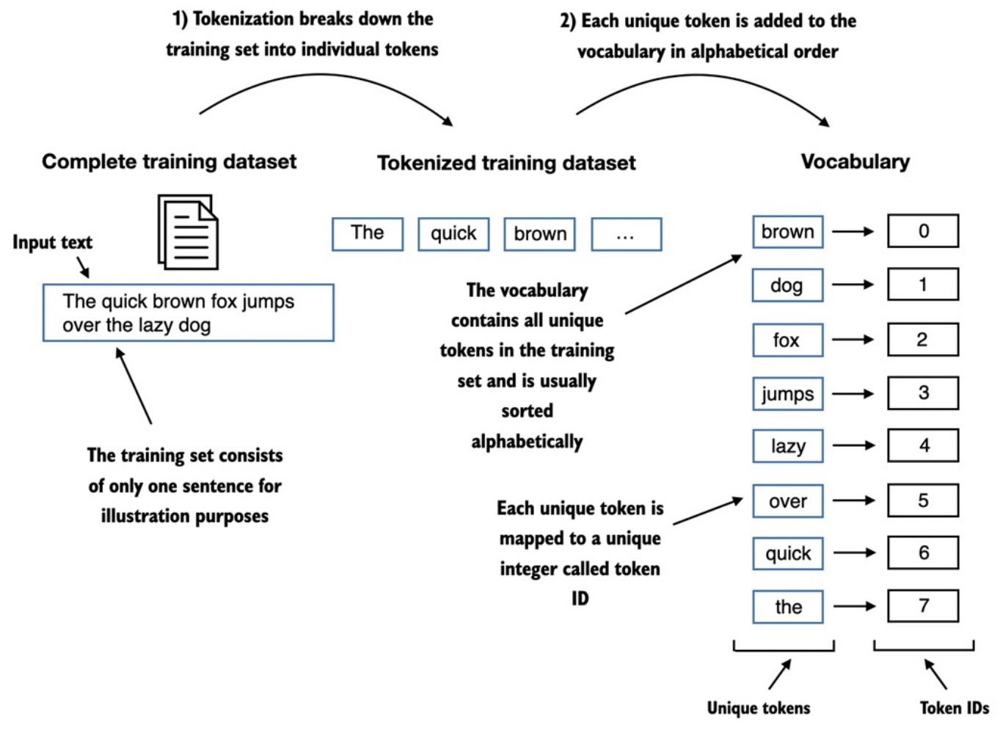

In [ ]:
all_words = sorted(list(set(preprocessed)))
vocab_size = len(all_words)
print(vocab_size)

1130


In [ ]:
vocab = {token: integer for integer, token in enumerate(all_words)}
for i, item in enumerate(vocab.items()):
  print(item)
  if i > 50:
    break

('!', 0)
('"', 1)
("'", 2)
('(', 3)
(')', 4)
(',', 5)
('--', 6)
('.', 7)
(':', 8)
(';', 9)
('?', 10)
('A', 11)
('Ah', 12)
('Among', 13)
('And', 14)
('Are', 15)
('Arrt', 16)
('As', 17)
('At', 18)
('Be', 19)
('Begin', 20)
('Burlington', 21)
('But', 22)
('By', 23)
('Carlo', 24)
('Chicago', 25)
('Claude', 26)
('Come', 27)
('Croft', 28)
('Destroyed', 29)
('Devonshire', 30)
('Don', 31)
('Dubarry', 32)
('Emperors', 33)
('Florence', 34)
('For', 35)
('Gallery', 36)
('Gideon', 37)
('Gisburn', 38)
('Gisburns', 39)
('Grafton', 40)
('Greek', 41)
('Grindle', 42)
('Grindles', 43)
('HAD', 44)
('Had', 45)
('Hang', 46)
('Has', 47)
('He', 48)
('Her', 49)
('Hermia', 50)
('His', 51)


As we can see, based on the output above, the dictionary contains individual
tokens associated with unique integer labels. Our next goal is to apply this
vocabulary to convert new text into token IDs

*Starting with a new text sample, we tokenize the text and use the vocabulary to convert
the text tokens into token IDs. The vocabulary is built from the entire training set and can be
applied to the training set itself and any new text samples. The depicted vocabulary contains no
punctuation or special characters for simplicity.*

**1.1.2.1 Implementation of complete tokenizer class in python**

In [ ]:
class SimpleTokenizerV1:
    def __init__(self, vocab):
        self.str_to_int = vocab
        self.int_to_str = {i:s for s,i in vocab.items()}

    def encode(self, text):
        preprocessed = re.split(r'([,.:;?_!"()\']|--|\s)', text)

        preprocessed = [
            item.strip() for item in preprocessed if item.strip()
        ]
        ids = [self.str_to_int[s] for s in preprocessed]
        return ids

    def decode(self, ids):
        text = " ".join([self.int_to_str[i] for i in ids])
        # Replace spaces before the specified punctuations
        text = re.sub(r'\s+([,.?!"()\'])', r'\1', text)
        return text

Let's instantiate a new tokenizer object from the SimpleTokenizerV1 class
and tokenize a passage from Edith Wharton's short story to try it out in
practice:

In [ ]:
tokenizer = SimpleTokenizerV1(vocab)

text = """"It's the last he painted, you know,"
           Mrs. Gisburn said with pardonable pride."""
ids = tokenizer.encode(text)
print(ids)

[1, 56, 2, 850, 988, 602, 533, 746, 5, 1126, 596, 5, 1, 67, 7, 38, 851, 1108, 754, 793, 7]


Let's turn these tokens back into text

In [ ]:
print(tokenizer.decode(ids))

" It' s the last he painted, you know," Mrs. Gisburn said with pardonable pride.


Let's now apply a new text sample that is not contained in the training set:

In [ ]:
text = "hello, do you like tea?"
tokenizer.encode(text)

*The problem is that the word "Hello" was not used in the The Verdict short
story. Hence, it is not contained in the vocabulary. This highlights the need to
consider large and diverse training sets to extend the vocabulary when
working on LLMs.*

**1.1.2.2 Adding special context tokens**

In this section we will modify this tokenizer to handle unknown words

*We can modify the tokenizer to use an <|unk|> token
if it encounters a word that is not part of the vocabulary. Furthermore, we add
a token between unrelated texts. For example, when training GPT-like LLMs
on multiple independent documents or books, it is common to insert a token
before each document or book that follows a previous text source. This helps the LLM understand that, although these
text sources are concatenated for training, they are, in fact, unrelated.*

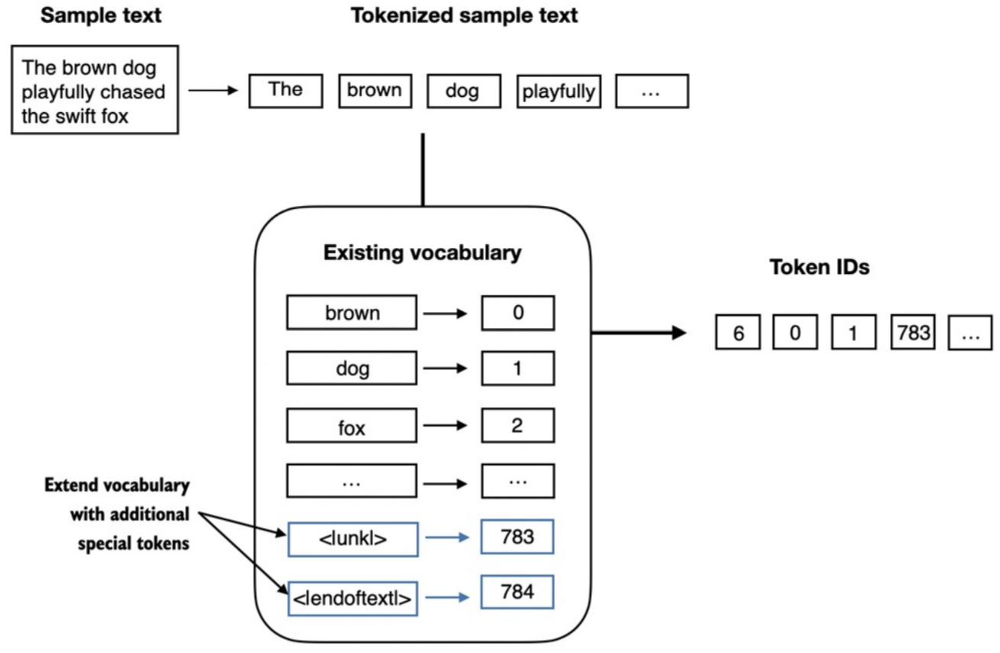

How GPT like models are trained while using data from different sources

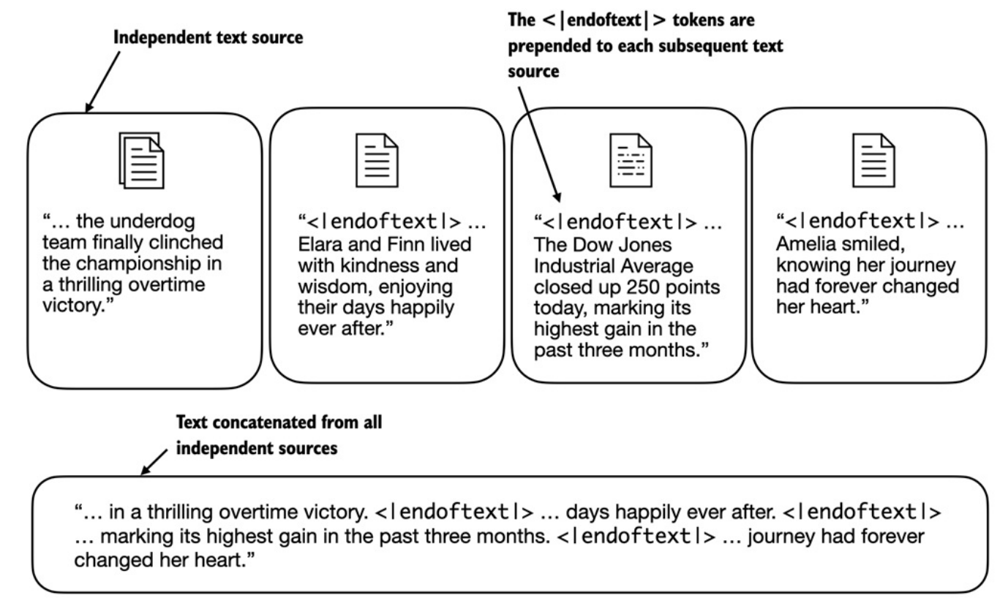

Let's now modify the vocabulary to include these two special tokens, <unk> and <|endoftext|>, by adding these to the list of all unique words that we created in the previous section:

In [ ]:
all_tokens = sorted(list(set(preprocessed)))
all_tokens.extend(["<|endoftext|>", "<|unk|>"])
vocab = {token:integer for integer, token in enumerate(all_tokens)}
print(len(vocab.items()))

1132


Let's print last 5 entries

In [ ]:
for i, item in enumerate(list(vocab.items())[-5:]):
  print(item)

('younger', 1127)
('your', 1128)
('yourself', 1129)
('<|endoftext|>', 1130)
('<|unk|>', 1131)


In [ ]:
class SimpleTokenizerV2:
    def __init__(self, vocab):
        self.str_to_int = vocab
        self.int_to_str = { i:s for s,i in vocab.items()}

    def encode(self, text):
        preprocessed = re.split(r'([,.:;?_!"()\']|--|\s)', text)
        preprocessed = [item.strip() for item in preprocessed if item.strip()]
        preprocessed = [
            item if item in self.str_to_int
            else "<|unk|>" for item in preprocessed
        ]

        ids = [self.str_to_int[s] for s in preprocessed]
        return ids

    def decode(self, ids):
        text = " ".join([self.int_to_str[i] for i in ids])
        # Replace spaces before the specified punctuations
        text = re.sub(r'\s+([,.:;?!"()\'])', r'\1', text)
        return text

Let's try new tokenizer in practise

In [ ]:
text1 = "Hello, do you like tea?"
text2 = "In the sunlit terraces of the palace."
text = " <|endoftext|> ".join((text1, text2))
print(text)

Hello, do you like tea? <|endoftext|> In the sunlit terraces of the palace.


In [ ]:
tokenizer = SimpleTokenizerV2(vocab)
ids = tokenizer.encode(text)
print(ids)
## In the output we can see we get 1130 for <|unk|> and 1131 for <|endoftext|>

[1131, 5, 355, 1126, 628, 975, 10, 1130, 55, 988, 956, 984, 722, 988, 1131, 7]


* Some tokenizers use special tokens to help the LLM with additional context
* Some of these special tokens are

*    [BOS] (beginning of sequence) marks the beginning of text
*    [EOS] (end of sequence) marks where the text ends (this is usually used to
     concatenate multiple unrelated texts, e.g., two different Wikipedia articles or two different books, and so on)
*    [PAD] (padding) if we train LLMs with a batch size greater than 1 (we may
     include multiple texts with different lengths; with the padding token we pad the shorter texts to the longest length so that all texts have an equal length)

* [UNK] to represent words that are not included in the vocabulary

* Note that GPT-2 does not need any of these tokens mentioned above but only
 uses an <|endoftext|> token to reduce complexity

* The <|endoftext|> is analogous to the [EOS] token mentioned above
* GPT also uses the <|endoftext|> for padding (since we typically use a        
   mask when training on batched inputs, we would not attend padded tokens anyways, so it does not matter what these tokens are)

* GPT-2 does not use an <UNK> token for out-of-vocabulary words; instead, GPT-2
 uses a byte-pair encoding (BPE) tokenizer, which breaks down words into subword units which we will discuss in a later section

* We use the <|endoftext|> tokens between two independent sources of text:






**1.1.3 Byte pair encoding**

*We implemented a simple tokenization scheme in the previous sections for
illustration purposes. This section covers a more sophisticated tokenization
scheme based on a concept called byte pair encoding (BPE). The BPE
tokenizer covered in this section was used to train LLMs such as GPT-2,
GPT-3, and the original model used in ChatGPT.*

Since implementing BPE can be relatively complicated, we will use an
existing Python open-source library called tiktoken
(https://github.com/openai/tiktoken), which implements the BPE algorithm
very efficiently based on source code in Rust. Similar to other Python
libraries, we can install the tiktoken library via Python's pip installer from the
terminal:

In [ ]:
pip install tiktoken

In [ ]:
import tiktoken
tokenizer = tiktoken.get_encoding("gpt2")

In [ ]:
text = "Hello, do you like tea? <|endoftext|> In the sunlit terraces of the palace."
tokens = tokenizer.encode(text, allowed_special={"<|endoftext|>"})
print(tokens)

[15496, 11, 466, 345, 588, 8887, 30, 220, 50256, 554, 262, 4252, 18250, 8812, 2114, 286, 262, 20562, 13]


Converting token IDs back into the text using the decode method, similar to our SimpleTokenizerV2

In [ ]:
strings = tokenizer.decode(tokens)
print(strings)

Hello, do you like tea? <|endoftext|> In the sunlit terraces of the palace.


*We can make two noteworthy observations based on the token IDs and
decoded text above. First, the <|endoftext|> token is assigned a relatively
large token ID, namely, 50256. In fact, the BPE tokenizer, which was used to
train models such as GPT-2, GPT-3, and the original model used in
ChatGPT, has a total vocabulary size of 50,257, with <|endoftext|> being
assigned the largest token ID.
Second, the BPE tokenizer above encodes and decodes unknown words, such
as "someunknownPlace" correctly. The BPE tokenizer can handle any
unknown word. How does it achieve this without using <|unk|> tokens?*

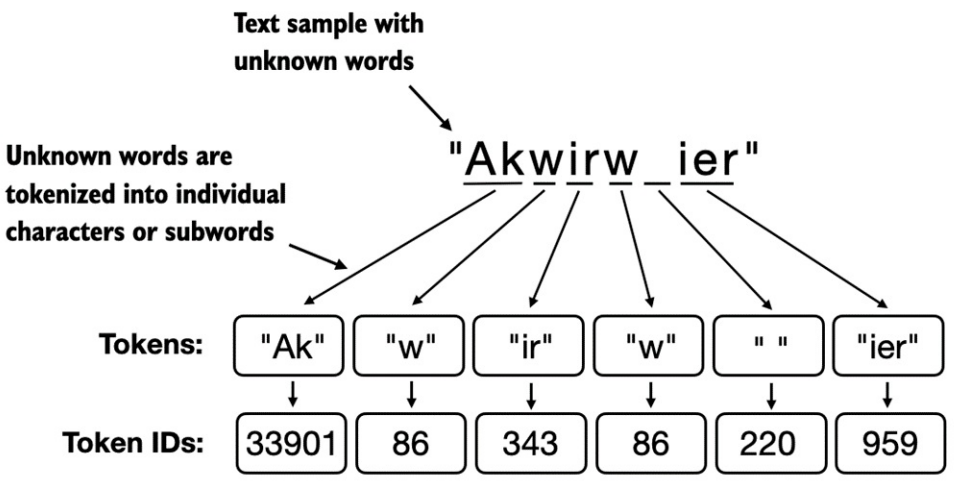

**BPE tokenizers break down unknown words into subwords and individual
characters. This way, a BPE tokenizer can parse any word and doesn't need to replace unknown
words with special tokens, such as <|unk|>.**

In [ ]:
text = "Akwirw ier"
tokens = tokenizer.encode(text, allowed_special={"<|endoftext|>"})
print(tokens)

[33901, 86, 343, 86, 220, 959]


In [ ]:
strings = tokenizer.decode(tokens)
print(strings)

Akwirw ier


**1.1.4 Data sampling with a sliding window**

*The previous section covered the tokenization steps and conversion from
string tokens into integer token IDs in great detail. The next step before we
can finally create the embeddings for the LLM is to generate the input-target
pairs required for training an LLM.
What do these input-target pairs look like? As we learned previously, LLMs
are pretrained by predicting the next word in a text, as shown in the picture*

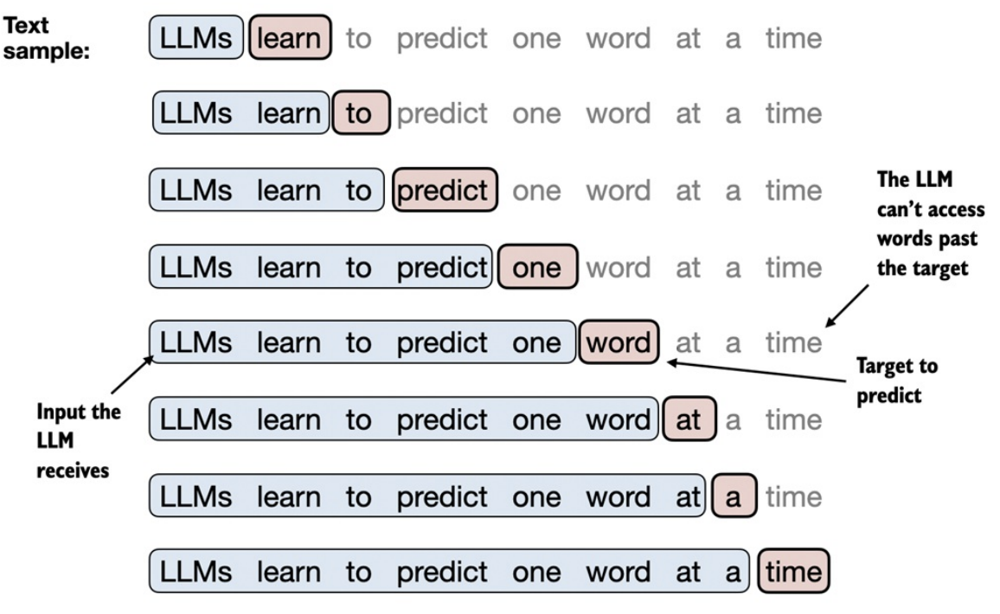

In this section we implement a data loader that fetches the input-target pairs
depicted in Figure 2.12 from the training dataset using a sliding window
approach.
To get started, we will first tokenize the whole The Verdict short story we
worked with earlier using the BPE tokenizer introduced in the previous
section:

In [ ]:
with open("the-verdict.txt", "r", encoding="utf-8") as fp:
    text = fp.read()

enc_text = tokenizer.encode(raw_text)
print(len(enc_text))

5145


Next, we remove the first 50 tokens from the dataset for demonstration pruposes as it results in a slightly more interesting text passage in the next steps:

In [ ]:
enc_sample = enc_text[50:]

One of the easiest and most intutive ways to create the input-target pairs for the next-word prediction task is to create two variables, x and y, where x contains the input tokens and y contains the targets, which are the inputs shifted by 1:

In [ ]:
context_size = 4 #A
x = enc_sample[:context_size]
y = enc_sample[1:context_size+1]
print(f"x: {x}")
print(f"y:      {y}")

x: [290, 4920, 2241, 287]
y:      [4920, 2241, 287, 257]


In [ ]:
for i in range(1, context_size+1):
  context = enc_sample[:i]
  desired = enc_sample[i]
  print(context, "--->", desired)

[290] ---> 4920
[290, 4920] ---> 2241
[290, 4920, 2241] ---> 287
[290, 4920, 2241, 287] ---> 257


Everything left of the arrow (---->) refers to the input an LLM would
receive, and the token ID on the right side of the arrow represents the target
token ID that the LLM is supposed to predict

*For illustration purposes, let's repeat the previous code but convert the token
IDs into text:*

In [ ]:
for i in range(1, context_size+1):
    context = enc_sample[:i]
    desired = enc_sample[i]

    print(tokenizer.decode(context), "---->", tokenizer.decode([desired]))

 and ---->  established
 and established ---->  himself
 and established himself ---->  in
 and established himself in ---->  a


*We've now created the input-target pairs that we can turn into use for the
LLM training in upcoming chapters.
There's only one more task before we can turn the tokens into embeddings, as
we mentioned at the beginning of this chapter: implementing an efficient data
loader that iterates over the input dataset and returns the inputs and targets as
PyTorch tensors, which can be thought of as multidimensional arrays.
In particular, we are interested in returning two tensors: an input tensor
containing the text that the LLM sees and a target tensor that includes the
targets for the LLM to predict, as depicted in Figure 2.13.*

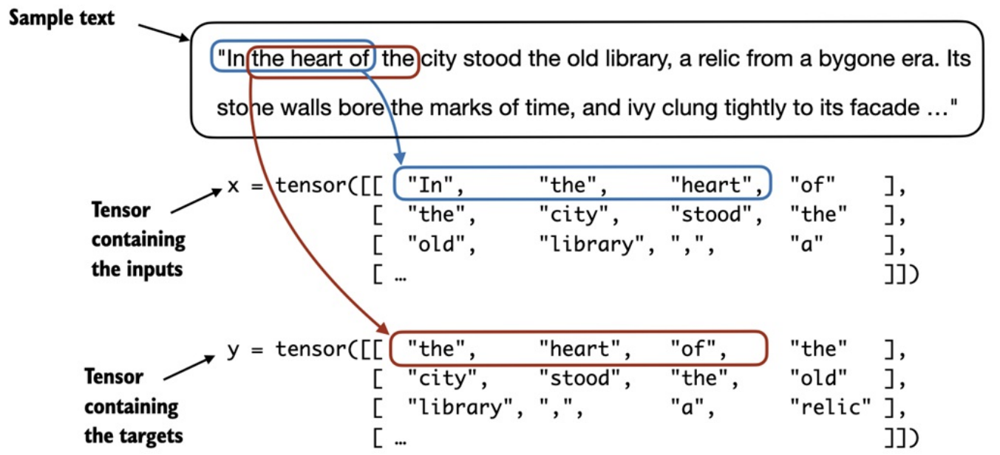

**To implement efficient data loaders, we collect the inputs in a tensor, x, where each
row represents one input context. A second tensor, y, contains the corresponding prediction
targets (next words), which are created by shifting the input by one position.**

------------------------------------------------------------------------------------
While Figure 2.13 shows the tokens in string format for illustration purposes,
the code implementation will operate on token IDs directly since the encode
method of the BPE tokenizer performs both tokenization and conversion into
token IDs as a single step.
For the efficient data loader implementation, we will use PyTorch's built-in
Dataset and DataLoader classes.

**A dataset for batched inputs and targets**

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader

class GPTDatasetV1(Dataset):
  def __init__(self, txt, tokenizer, max_length, stride):
    self.tokenizer = tokenizer
    self.input_ids = []
    self.target_ids = []

    token_ids = tokenizer.encode(txt) #A
    for i in range(0, len(token_ids) - max_length, stride):
      input_chunk = token_ids[i:i + max_length]
      target_chunk = token_ids[i + 1: i + max_length + 1]
      self.input_ids.append(torch.tensor(input_chunk))
      self.target_ids.append(torch.tensor(target_chunk))

  def __len__(self):
    return len(self.input_ids)

  def __getitem__(self, idx):
    return self.input_ids[idx], self.target_ids[idx]


**A data loader to generate batches with input-with pairs**

In [ ]:
def create_dataloader_v1(txt, batch_size=4, max_length=256, stride=128,
                         shuffle=True, drop_last=True):
  tokenizer = tiktoken.get_encoding("gpt2")
  dataset = GPTDatasetV1(txt, tokenizer, max_length, stride) #B
  dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=shuffle,
                        drop_last=drop_last)
  return dataloader

Let's test the dataloader with a batch size of 1 for an LLM with a context size of 4 to develop an intitution of how the GPTDatasetV1 class and create_dataloader_v1 funtion

In [ ]:
with open("the-verdict.txt", "r", encoding="utf-8") as f:
  text = f.read()

dataloader = create_dataloader_v1(
    raw_text, batch_size=1, max_length=4, stride=1, shuffle=False, drop_last=False
)
data_iter = iter(dataloader)
first_batch = next(data_iter)
print(first_batch)

[tensor([[  40,  367, 2885, 1464]]), tensor([[ 367, 2885, 1464, 1807]])]


WHat is meaning of stride=1?

In [ ]:
second_batch = next(data_iter)
print(second_batch)

[tensor([[ 367, 2885, 1464, 1807]]), tensor([[2885, 1464, 1807, 3619]])]


If we compare the first with the second batch, we can see that the second
batch's token IDs are shifted by one position compared to the first batch (for
example, the second ID in the first batch's input is 367, which is the first ID
of the second batch's input). The stride setting dictates the number of
positions the inputs shift across batches, emulating a sliding window
approach

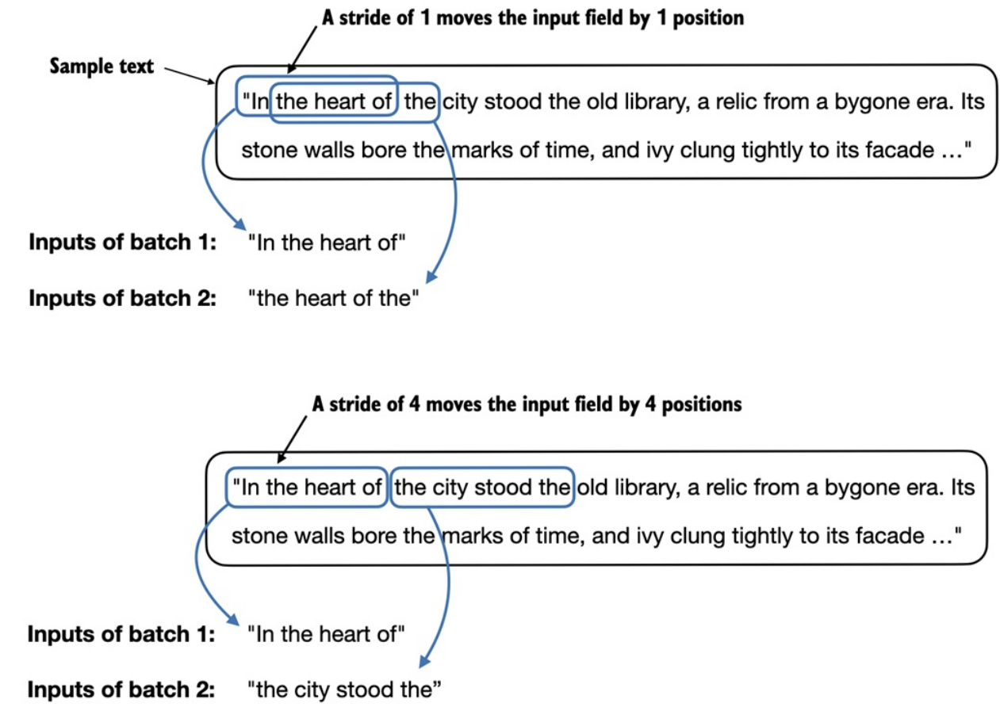

*When creating multiple batches from the input dataset, we slide an input window
across the text. If the stride is set to 1, we shift the input window by 1 position when creating the
next batch. If we set the stride equal to the input window size, we can prevent overlaps between
the batches.*

Before we move forward on to creating the embedding vectors from the token IDs, let's have a brief look
at how we can use the data loader to sample with a batch size greater than 1:

In [ ]:
dataloader = create_dataloader_v1(raw_text, batch_size=8, max_length=4, stride=4, shuffle=False)

data_iter = iter(dataloader)
inputs, targets = next(data_iter)
print("Inputs:\n", inputs)
print("\nTargets:\n", targets)

Inputs:
 tensor([[   40,   367,  2885,  1464],
        [ 1807,  3619,   402,   271],
        [10899,  2138,   257,  7026],
        [15632,   438,  2016,   257],
        [  922,  5891,  1576,   438],
        [  568,   340,   373,   645],
        [ 1049,  5975,   284,   502],
        [  284,  3285,   326,    11]])

Targets:
 tensor([[  367,  2885,  1464,  1807],
        [ 3619,   402,   271, 10899],
        [ 2138,   257,  7026, 15632],
        [  438,  2016,   257,   922],
        [ 5891,  1576,   438,   568],
        [  340,   373,   645,  1049],
        [ 5975,   284,   502,   284],
        [ 3285,   326,    11,   287]])


Note that we increase the stride to 4. This is to utilize the data set fully (we
don't skip a single word) but also avoid any overlap between the batches,
since more overlap could lead to increased overfitting.

**1.1.5 Create token embeddings**


The last step for preparing the input text for LLM training is to convert the
token IDs into embedding vectors,

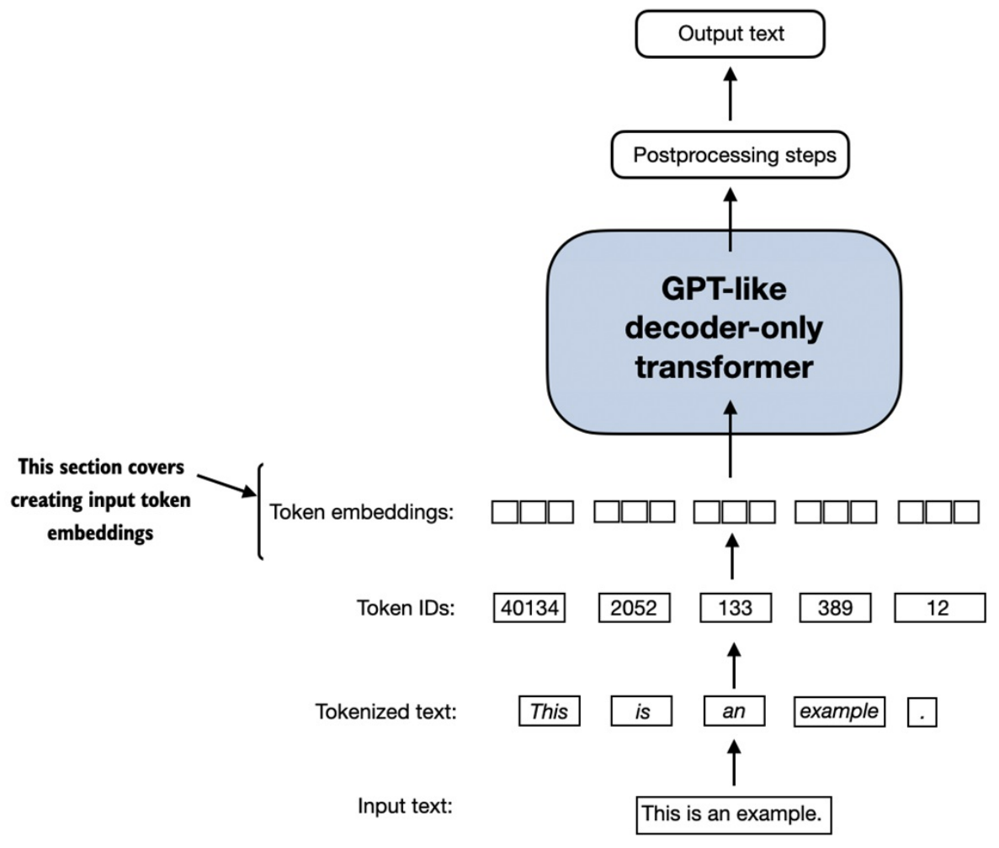

**Preparing the input text for an LLM involves tokenizing text, converting text tokens
to token IDs, and converting token IDs into vector embedding vectors**

*It is important to note
that we initialize these embedding weights with random values as a
preliminary step. This initialization serves as the starting point for the LLM's
learning process. We will optimize the embedding weights as part of the
LLM training in next sections*

A small illustration showing how token ID to embedding vector conversion works

In [ ]:
# Suppose we ave the follwoing four input tokens with IDs 2, 3, 5, and 1
input_ids = torch.tensor([2,3,5,1])

''' Suppose we have a small vocabulary of only 6 words(instead of the 50,257 words in the BPE tokenizer vocabulary),
and we want to create embeddings of size 3 (in GPT-3, the embedding size is 12,288 dimensions): '''

# Initialize the embedding weights
vocab_size = 6
output_dim = 3

#Using the vocab_size and output_dim, we cna instantiate an embeding layer in PyTorch, setting the random seed to 123 for reporducibility purposes:
torch.manual_seed(123)
embedding_layer = torch.nn.Embedding(vocab_size, output_dim)
print(embedding_layer.weight)

Parameter containing:
tensor([[ 0.3374, -0.1778, -0.1690],
        [ 0.9178,  1.5810,  1.3010],
        [ 1.2753, -0.2010, -0.1606],
        [-0.4015,  0.9666, -1.1481],
        [-1.1589,  0.3255, -0.6315],
        [-2.8400, -0.7849, -1.4096]], requires_grad=True)


*We can see that the weight matrix of the embedding layer contains small,
random values. These values are optimized during LLM training as part of
the LLM optimization itself, as we will see in upcoming chapters. Moreover,
we can see that the weight matrix has six rows and three columns. There is
one row for each of the six possible tokens in the vocabulary. And there is
one column for each of the three embedding dimensions.*

After we instantiated the embedding layer, let's now apply it to a token ID to
obtain the embedding vector:

In [ ]:
print(embedding_layer(torch.tensor([3])))


tensor([[-0.4015,  0.9666, -1.1481]], grad_fn=<EmbeddingBackward0>)


*If we compare the embedding vector for token ID 3 to the previous
embedding matrix, we see that it is identical to the 4th row (Python starts
with a zero index, so it's the row corresponding to index 3). In other words,
the embedding layer is essentially a look-up operation that retrieves rows
from the embedding layer's weight matrix via a token ID.*

**Embedding Layers versus matrix multiplication**

For those who are familiar with one-hot encoding, the embedding layer
approach above is essentially just a more efficient way of implementing onehot encoding followed by matrix multiplication in a fully connected layer.


Embedding layer is just a more efficient implementation equivalent to the
one-hot encoding and matrix-multiplication approach, it can be seen as a
neural network layer that can be optimized via backpropagation.

In [ ]:
print(embedding_layer(input_ids))


tensor([[ 1.2753, -0.2010, -0.1606],
        [-0.4015,  0.9666, -1.1481],
        [-2.8400, -0.7849, -1.4096],
        [ 0.9178,  1.5810,  1.3010]], grad_fn=<EmbeddingBackward0>)


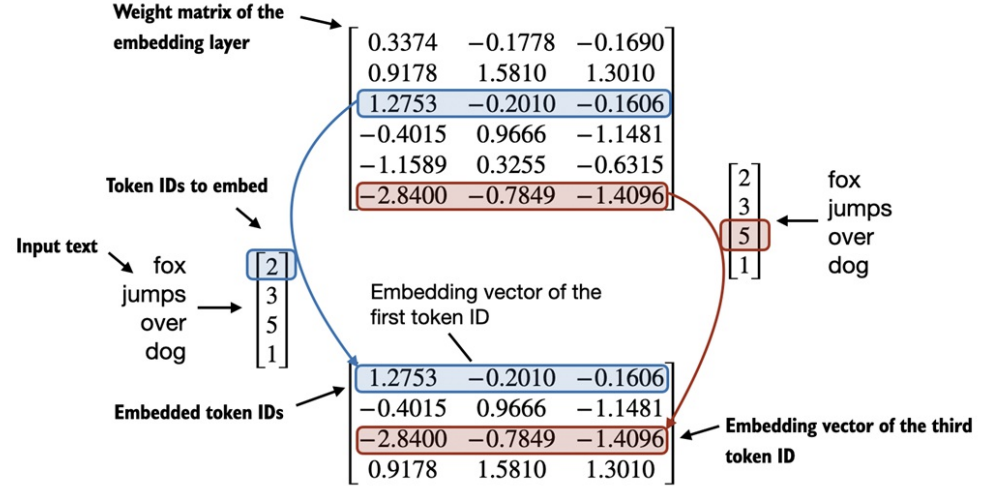

**Embedding layers perform a look-up operation, retrieving the embedding vector
corresponding to the token ID from the embedding layer's weight matrix. For instance, the
embedding vector of the token ID 5 is the sixth row of the embedding layer weight matrix (it is
the sixth instead of the fifth row because Python starts counting at 0).**

**1.1.6 Encoding word positions**


In the previous section, we converted the token IDs into a continuous vector
representation, the so-called token embeddings. In principle, this is a suitable
input for an LLM. However, a minor shortcoming of LLMs is that their selfattention mechanism

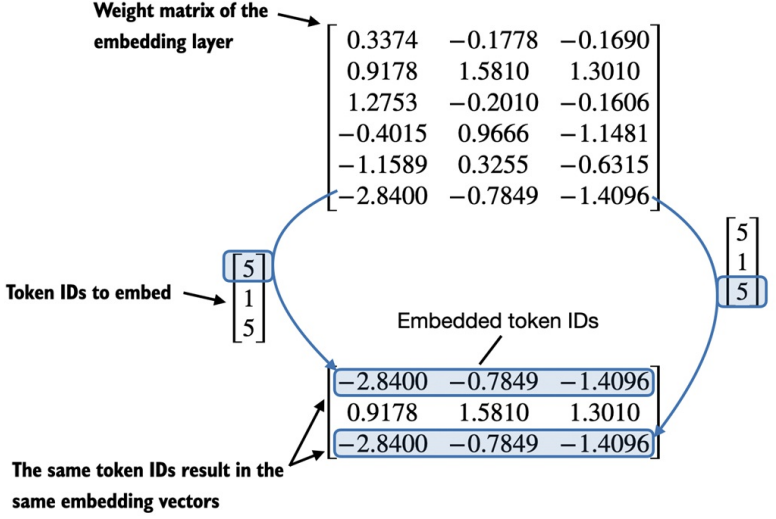

**The embedding layer converts a token ID into the same vector representation
regardless of where it is located in the input sequence. For example, the token ID 5, whether it's
in the first or third position in the token ID input vector, will result in the same embedding
vector.**

*In principle, the deterministic, position-independent embedding of the token
ID is good for reproducibility purposes. However, since the self-attention
mechanism of LLMs itself is also position-agnostic, it is helpful to inject
additional position information into the LLM.
To achieve this, there are two broad categories of position-aware
embeddings: relative positional embeddings and absolute positional
embeddings.
Absolute positional embeddings are directly associated with specific
positions in a sequence. For each position in the input sequence, a unique
embedding is added to the token's embedding to convey its exact location.
For instance, the first token will have a specific positional embedding, the
second token another distinct embedding*

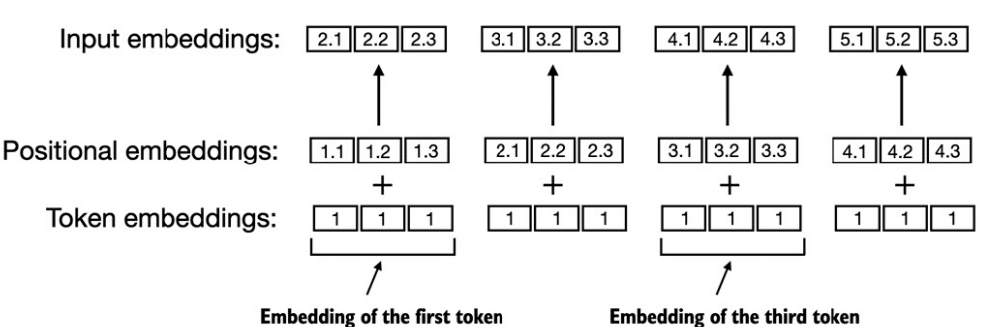

**Positional embeddings are added to the token embedding vector to create the input
embeddings for an LLM. The positional vectors have the same dimension as the original token
embeddings. The token embeddings are shown with value 1 for simplicity.**

*Instead of focusing on the absolute position of a token, the emphasis of
relative positional embeddings is on the relative position or distance between
tokens. This means the model learns the relationships in terms of "how far
apart" rather than "at which exact position." The advantage here is that the
model can generalize better to sequences of varying lengths, even if it hasn't
seen such lengths during training.*

*Both types of positional embeddings aim to augment the capacity of LLMs to
understand the order and relationships between tokens, ensuring more
accurate and context-aware predictions. The choice between them often
depends on the specific application and the nature of the data being
processed.*

**What embeddings does OpenAi's GPT models use?**

OpenAI's GPT models use absolute positional embeddings that are optimized
during the training process rather than being fixed or predefined like the
positional encodings in the original Transformer model. This optimization
process is part of the model training itself, which we will implement later in
this book. For now, let's create the initial positional embeddings to create the
LLM inputs for the upcoming chapters.

In [ ]:
output_dim = 256
vocab_size = 50257
token_embedding_layer = torch.nn.Embedding(vocab_size, output_dim)

Using the token_embedding_layer above, if we sample data from the data
loader, we embed each token in each batch into a 256-dimensional vector. If
we have a batch size of 8 with four tokens each, the result will be an 8 x 4 x
256 tensor.

In [ ]:
max_length = 4
dataloader = create_dataloader_v1(
    raw_text, batch_size=8, max_length=max_length,
    stride=max_length, shuffle=False
)
data_iter = iter(dataloader)
inputs, targets = next(data_iter)

In [ ]:
print("Token IDs:\n", inputs)
print("\nInputs shape:\n", inputs.shape)

Token IDs:
 tensor([[   40,   367,  2885,  1464],
        [ 1807,  3619,   402,   271],
        [10899,  2138,   257,  7026],
        [15632,   438,  2016,   257],
        [  922,  5891,  1576,   438],
        [  568,   340,   373,   645],
        [ 1049,  5975,   284,   502],
        [  284,  3285,   326,    11]])

Inputs shape:
 torch.Size([8, 4])


As we can see, the token ID tensor is 8x4-dimensional, meaning that the data
batch consists of 8 text samples with 4 tokens each.
Let's now use the embedding layer to embed these token IDs into 256-
dimensional vectors:

In [ ]:
token_embeddings = token_embedding_layer(inputs)
print(token_embeddings.shape)

torch.Size([8, 4, 256])




*   GPT-2 uses absolute position embeddings, so we just create another embedding layer:



In [ ]:
context_length = max_length
pos_embedding_layer = torch.nn.Embedding(context_length, output_dim)

In [ ]:
pos_embeddings = pos_embedding_layer(torch.arange(max_length))
print(pos_embeddings.shape)

torch.Size([4, 256])


*   To create the input embeddings used in an LLM, we simply add the token and the positional embeddings:

In [ ]:
input_embeddings = token_embeddings + pos_embeddings
print(input_embeddings.shape)

torch.Size([8, 4, 256])


*   In the initial phase of the input processing workflow, the input text is segmented into separate tokens
*   Following this segmentation, these tokens are transformed into token IDs based on a predefined vocabulary:

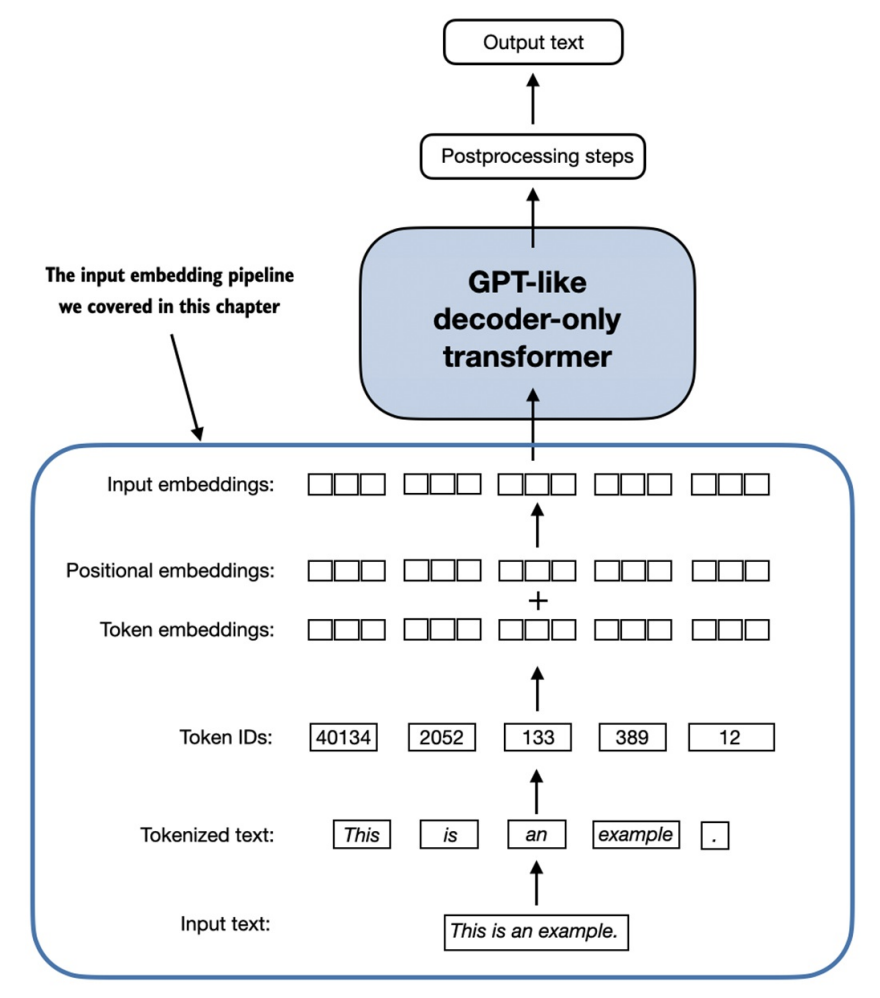

**As part of the input processing pipeline, input text is first broken up into individual
tokens. These tokens are then converted into token IDs using a vocabulary. The token IDs are
converted into embedding vectors to which positional embeddings of a similar size are added,
resulting in input embeddings that are used as input for the main LLM layers.**

**2.1 Understanding Attention Mechanism**

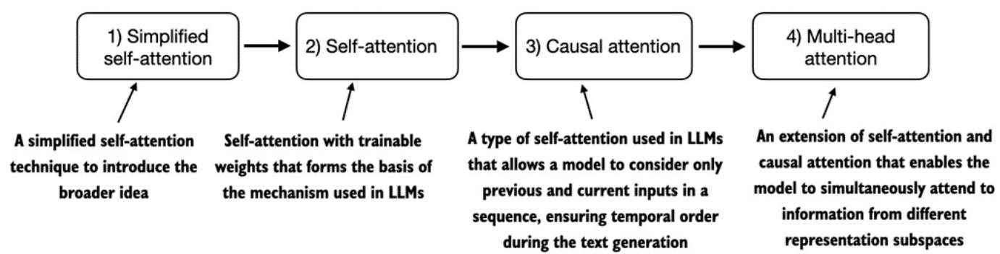

*Self-attention is a mechanism that allows each position in the input sequence
to attend to all positions in the same sequence when computing the
representation of a sequence. Self-attention is a key component of
contemporary LLMs based on the transformer architecture, such as the GPT
series.*

**2.1.1 Attending to different parts of input with self Attention**

**'self' in self-attention**

*In self-attention, the "self" refers to the mechanism's ability to compute
attention weights by relating different positions within a single input
sequence. It assesses and learns the relationships and dependencies between
various parts of the input itself, such as words in a sentence or pixels in an
image. This is in contrast to traditional attention mechanisms, where the
focus is on the relationships between elements of two different sequences,
such as in sequence-to-sequence models where the attention might be
between an input sequence and an output sequence*

**2.1.2 A simple self-attention mechanism without trainable
weights**

In [72]:
import torch

inputs = torch.tensor(
  [[0.43, 0.15, 0.89], # Your     (x^1)
   [0.55, 0.87, 0.66], # journey  (x^2)
   [0.57, 0.85, 0.64], # starts   (x^3)
   [0.22, 0.58, 0.33], # with     (x^4)
   [0.77, 0.25, 0.10], # one      (x^5)
   [0.05, 0.80, 0.55]] # step     (x^6)
)



*   (In this notebook, we follow the common machine  
     learning and deep learning convention where training examples are represented as rows and feature values as columns; in the case of the tensor shown above, each row represents a word, and each column represents an embedding dimension)



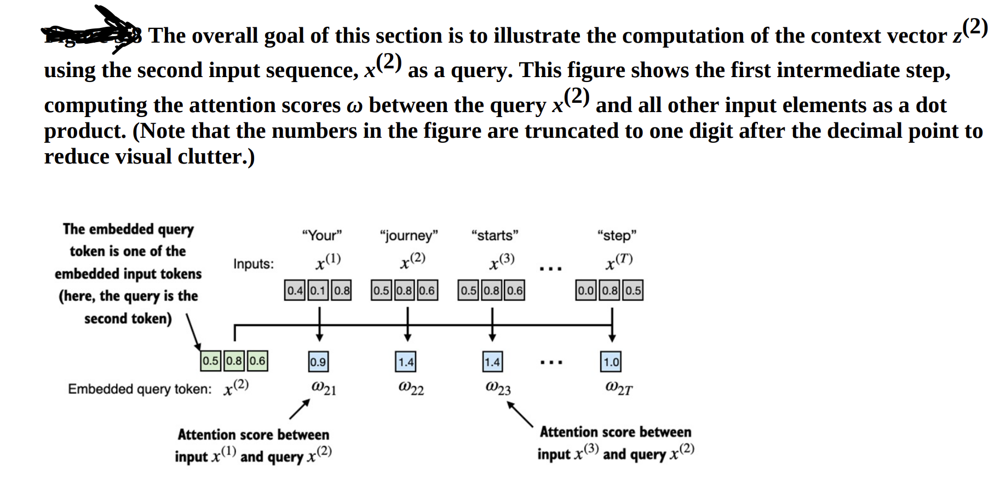

**How dot product works**

0.43 X 0.55 + 0.15 X 0.87 + 0.89 X 0.66 = 0.9544

In [ ]:
query = inputs[1]
attn_scores_2 = torch.empty(inputs.shape[0])
for i, x_i in enumerate(inputs):
  print(i, x_i)
  attn_scores_2[i] = torch.dot(x_i, query)
print(attn_scores_2)

0 tensor([0.4300, 0.1500, 0.8900])
1 tensor([0.5500, 0.8700, 0.6600])
2 tensor([0.5700, 0.8500, 0.6400])
3 tensor([0.2200, 0.5800, 0.3300])
4 tensor([0.7700, 0.2500, 0.1000])
5 tensor([0.0500, 0.8000, 0.5500])
tensor([0.9544, 1.4950, 1.4754, 0.8434, 0.7070, 1.0865])


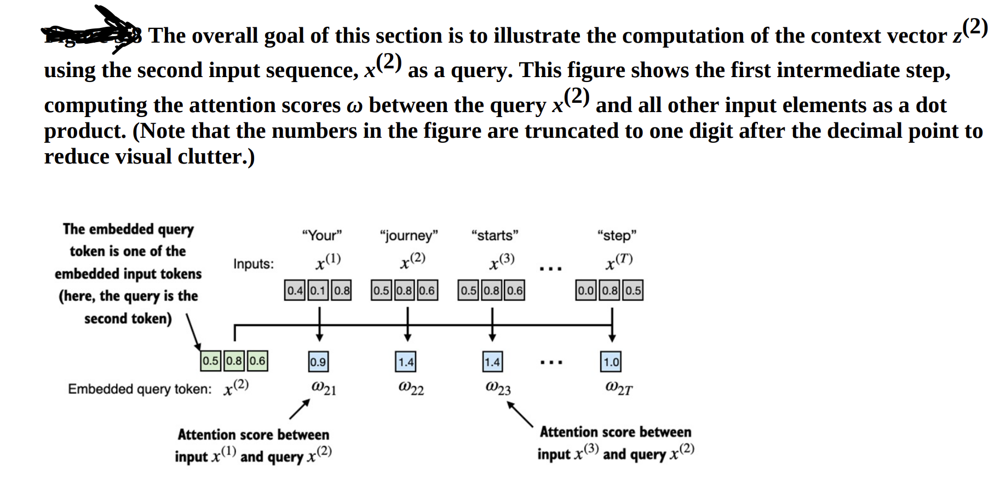

The main goal behind the normalization shown in above figure is to obtain
attention weights that sum up to 1. This normalization is a convention that is
useful for interpretation and for maintaining training stability in an LLM.

In [ ]:
attn_weights_2_tmp = attn_scores_2 / attn_scores_2.sum()
print("Attention weights:", attn_weights_2_tmp)
print("Sum:", attn_weights_2_tmp.sum())

Attention weights: tensor([0.1455, 0.2278, 0.2249, 0.1285, 0.1077, 0.1656])
Sum: tensor(1.0000)


In practice, it's more common and advisable to use the softmax function for
normalization. This approach is better at managing extreme values and offers
more favorable gradient properties during training.

In [ ]:
def softmax_naive(x):
  return torch.exp(x) / torch.exp(x).sum(dim=0)
attn_weights_2_naive = softmax_naive(attn_scores_2)
print("Attention weights:", attn_weights_2_naive)
print("Sum:", attn_weights_2_naive.sum())

Attention weights: tensor([0.1385, 0.2379, 0.2333, 0.1240, 0.1082, 0.1581])
Sum: tensor(1.)


**Note** *that this naive softmax implementation (softmax_naive) may encounter
numerical instability problems, such as overflow and underflow, when
dealing with large or small input values. Therefore, in practice, it's advisable
to use the PyTorch implementation of softmax, which has been extensively
optimized for performance:*

In [ ]:
attn_weights_2 = torch.softmax(attn_scores_2, dim=0)
print("Attention weights:", attn_weights_2)
print("Sum:", attn_weights_2.sum())

Attention weights: tensor([0.1385, 0.2379, 0.2333, 0.1240, 0.1082, 0.1581])
Sum: tensor(1.)


Now After computing the normalised attention weights, we need to calculate the context vector $z^{(2)}$ by multiplying the embedded input tokens, $x^{(i)}$, with the corresponding attention weights and then summing the resulting vectors.

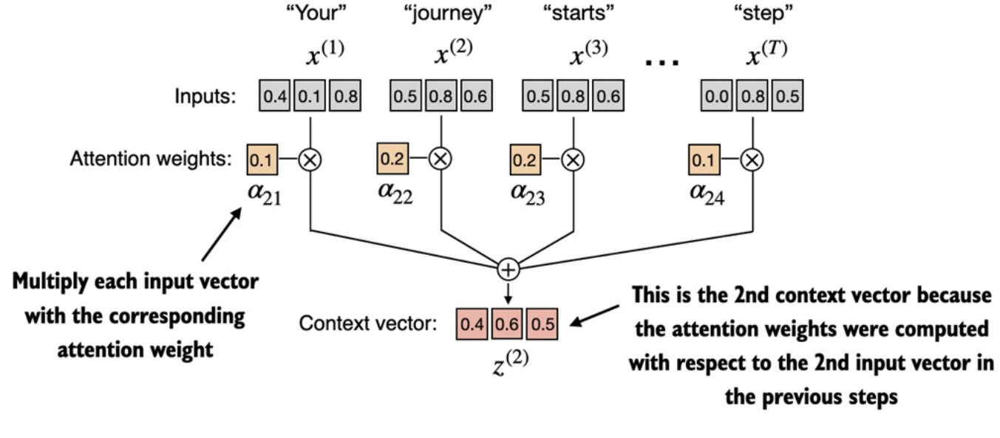

In [76]:
query = inputs[1] #2nd input token is the query
context_vec_2 = torch.zeros(query.shape)
for i,x_i in enumerate(inputs):
  print(attn_weights_2[i])
  print(x_i)
  print(attn_weights_2[i]*x_i)
  context_vec_2 += attn_weights_2[i]*x_i
#print(context_vec_2)

tensor(0.1500)
tensor([0.4300, 0.1500, 0.8900])
tensor([0.0645, 0.0225, 0.1335])
tensor(0.2264)
tensor([0.5500, 0.8700, 0.6600])
tensor([0.1245, 0.1970, 0.1494])
tensor(0.2199)
tensor([0.5700, 0.8500, 0.6400])
tensor([0.1253, 0.1869, 0.1407])
tensor(0.1311)
tensor([0.2200, 0.5800, 0.3300])
tensor([0.0288, 0.0760, 0.0433])
tensor(0.0906)
tensor([0.7700, 0.2500, 0.1000])
tensor([0.0698, 0.0227, 0.0091])
tensor(0.1820)
tensor([0.0500, 0.8000, 0.5500])
tensor([0.0091, 0.1456, 0.1001])


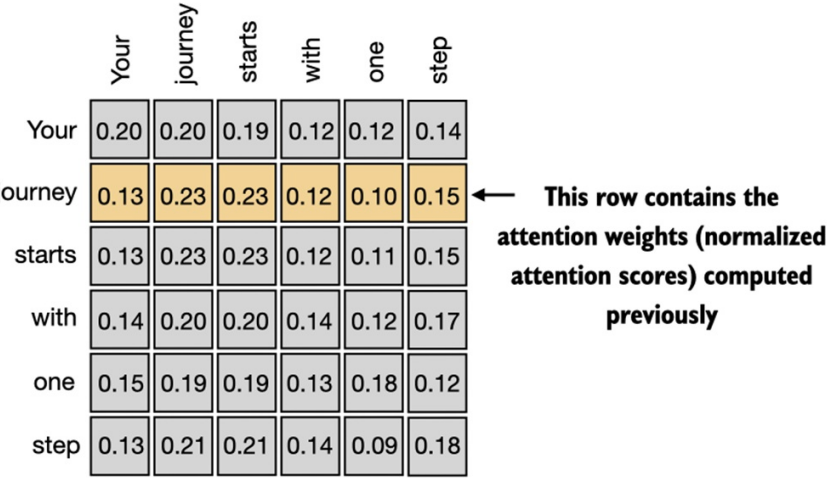

**The highlighted row shows the attention weights for the second input element as a
query, as we computed in the previous section. This section generalizes the computation to obtain
all other attention weights**

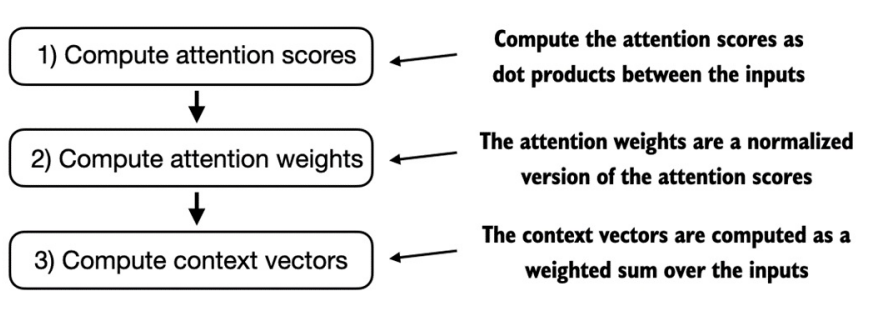

In [ ]:
attn_scores = torch.empty(6,6)
for i, x_i in enumerate(inputs):
  for j, x_j in enumerate(inputs):
    attn_scores[i, j] = torch.dot(x_i, x_j)
print(attn_scores)

tensor([[0.9995, 0.9544, 0.9422, 0.4753, 0.4576, 0.6310],
        [0.9544, 1.4950, 1.4754, 0.8434, 0.7070, 1.0865],
        [0.9422, 1.4754, 1.4570, 0.8296, 0.7154, 1.0605],
        [0.4753, 0.8434, 0.8296, 0.4937, 0.3474, 0.6565],
        [0.4576, 0.7070, 0.7154, 0.3474, 0.6654, 0.2935],
        [0.6310, 1.0865, 1.0605, 0.6565, 0.2935, 0.9450]])


In the above illustration we used `for` loops for computation, but being nested `for` loop they are slow and we will be using this same result using `matrix` multiplication

In [ ]:
attn_scores = inputs @ inputs.T
print(attn_scores)

tensor([[0.9995, 0.9544, 0.9422, 0.4753, 0.4576, 0.6310],
        [0.9544, 1.4950, 1.4754, 0.8434, 0.7070, 1.0865],
        [0.9422, 1.4754, 1.4570, 0.8296, 0.7154, 1.0605],
        [0.4753, 0.8434, 0.8296, 0.4937, 0.3474, 0.6565],
        [0.4576, 0.7070, 0.7154, 0.3474, 0.6654, 0.2935],
        [0.6310, 1.0865, 1.0605, 0.6565, 0.2935, 0.9450]])


Now normalising the attention scores to get attention weights

In [ ]:
attn_weights = torch.softmax(attn_scores, dim=1)
print(attn_weights)

tensor([[0.2098, 0.2006, 0.1981, 0.1242, 0.1220, 0.1452],
        [0.1385, 0.2379, 0.2333, 0.1240, 0.1082, 0.1581],
        [0.1390, 0.2369, 0.2326, 0.1242, 0.1108, 0.1565],
        [0.1435, 0.2074, 0.2046, 0.1462, 0.1263, 0.1720],
        [0.1526, 0.1958, 0.1975, 0.1367, 0.1879, 0.1295],
        [0.1385, 0.2184, 0.2128, 0.1420, 0.0988, 0.1896]])


Before moving foreward let us briefly verify if the rows sum to 1

In [ ]:
row_2_sum = torch.sum(attn_weights[2])
print(row_2_sum)
print("All row sums:", torch.sum(attn_weights, dim=1))

tensor(1.0000)
All row sums: tensor([1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000])


Now in the last step, we now use these attention weights to compute all context vectors via matrix multiplication

In [ ]:
all_context_vecs = attn_weights @ inputs
print(all_context_vecs)

tensor([[0.4421, 0.5931, 0.5790],
        [0.4419, 0.6515, 0.5683],
        [0.4431, 0.6496, 0.5671],
        [0.4304, 0.6298, 0.5510],
        [0.4671, 0.5910, 0.5266],
        [0.4177, 0.6503, 0.5645]])


In [ ]:
print("Previous 2nd context vector:", context_vec_2)

Previous 2nd context vector: tensor([0.4419, 0.6515, 0.5683])


*Based on the result, we can see that the previously calculated context_vec_2
matches the second row in the previous tensor exactly*

**2.2 Implementing self-attention with trainable weights**

*The self attention mechanism is also called scaled dot-product attention*

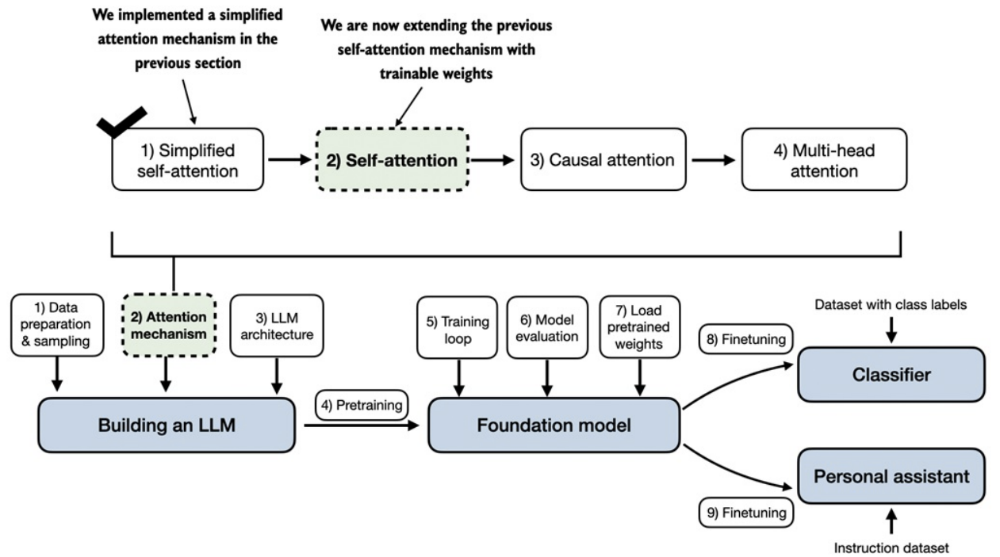

*In this section, we add trainable weights to this attention mechanism. In the
upcoming sections, we will then extend this self-attention mechanism by adding a causal mask
and multiple heads.*

The self-attention mechanism with trainable weights.

The most notable difference is the introduction of weight matrices that are
updated during model training. These trainable weight matrices are crucial so
that the model (specifically, the attention module inside the model) can learn
to produce "good" context vectors.

**2.2.1 Computing the attention weights step by step**

We will implement the self-attention mechanism step by step by introducing
the three trainable weight matrices $W_{q}$
, $W_{k}$
, and $W_{v}$
. These three matrices are
used to project the embedded input tokens, $x^{i}$
, into query, key, and value
vectors as illustrated in Figure

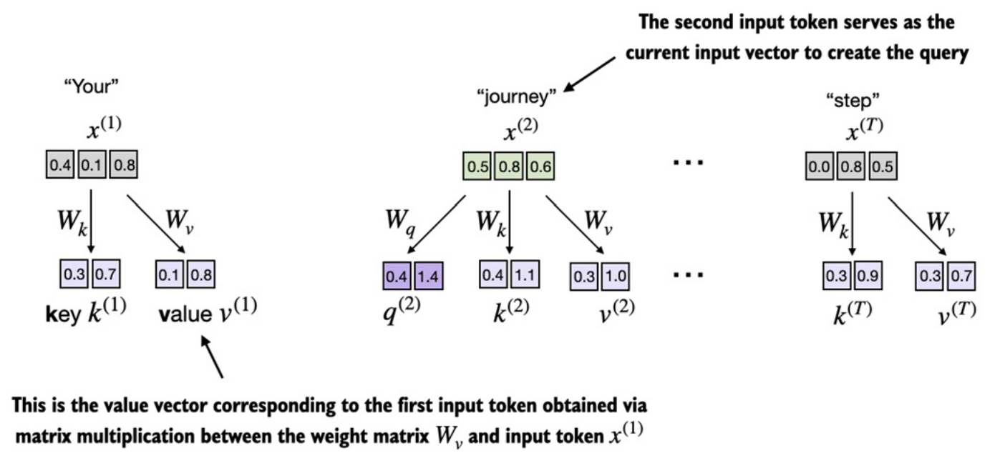

**In the first step of the self-attention mechanism with trainable weight matrices, we
compute query (q), key (k), and value (v) vectors for input elements x. Similar to previous
sections, we designate the second input, $x^{(2)}$
, as the query input. The query vector $q^{(2)}$
is obtained
via matrix multiplication between the input $x^{(2)}$ and the weight matrix Wq. Similarly, we obtain
the key and value vectors via matrix multiplication involving the weight matrices $W_{k}$ and $W_{v}$**

In the earlier section also we defined the second input element $x^{(2)}$ as the query when we computed the simplified attention weights to compute the context vector $z^{(2)}$. Later we generalized this to compute all context vecotrs $z^{(1)}$... $z^{(T)}$ for the six-word input sentence "Your journey starts with one step."


Similarly here also we will start computing only one context vector, $z^{(2)}$, for illustration and once we understood things in details we will modify the code to calculate all context vectors

In [60]:
x_2 = inputs[1]
d_in = inputs.shape[1] #B
d_out = 2 #C

*Note that in GPT-like models, the input and output dimensions are usually
the same, but for illustration purposes, to better follow the computation, we
choose different input (d_in=3) and output (d_out=2) dimensions here.*

Next, we initialize the three weight matrices $W_{q}$, $W_{k}$ and $W_{v}$

Below, we initialize the three weight matrices; note that we are setting `requires_grad=False` to reduce clutter in the outputs for illustration purposes, but if we were to use the weight matrices for model training, we would set `requires_grad=True` to update these matrices during model training

In [61]:
torch.manual_seed(123)

W_query = torch.nn.Parameter(torch.rand(d_in, d_out), requires_grad=False)
W_key   = torch.nn.Parameter(torch.rand(d_in, d_out), requires_grad=False)
W_value = torch.nn.Parameter(torch.rand(d_in, d_out), requires_grad=False)

In [62]:
W_key

Parameter containing:
tensor([[0.1366, 0.1025],
        [0.1841, 0.7264],
        [0.3153, 0.6871]])

Next, we compute the query, key and value vectors

In [63]:
query_2 = x_2 @ W_query
key_2   = x_2 @ W_key
value_2 = x_2 @ W_value
print(query_2)

tensor([0.4306, 1.4551])


As we can see based on the output for the query, this results in a 2-
dimensional vector since we set the number of columns of the corresponding
weight matrix, via d_out, to 2:

**Weight parameters vs attention weights**


**Note** *that in the weight matrices W, the term "weight" is short for "weight
parameters," the values of a neural network that are optimized during
training. This is not to be confused with the attention weights. As we already
saw in the previous section, attention weights determine the extent to which a
context vector depends on the different parts of the input, i.e., to what extent
the network focuses on different parts of the input.
In summary, weight parameters are the fundamental, learned coefficients that
define the network's connections, while attention weights are dynamic,
context-specific values.*

----------------------------------------------------------------------------------------
Even though our temporary goal is to only compute the one context vector,
$z^{(2)}$
, we still require the key and value vectors for all input elements as they
are involved in computing the attention weights with respect to the query $q^{(2)}$


In [64]:
keys = inputs @ W_key
values = inputs @ W_value
print("keys.shape:", keys.shape)
print("values.shape:", values.shape)

keys.shape: torch.Size([6, 2])
values.shape: torch.Size([6, 2])


The second step is now to compute the attention scores as shown in the Figure

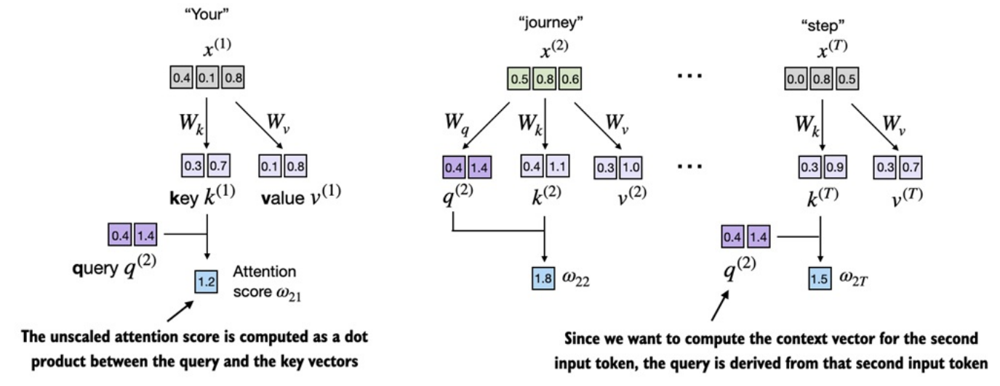

**The attention score computation is a dot-product computation similar to what we
have used in the simplified self-attention mechanism in previoud section. The new aspect here is that we
are not directly computing the dot-product between the input elements but using the query and
key obtained by transforming the inputs via the respective weight matrices.**

First, let's compute the attention score $ω_{22}$

In [65]:
keys_2 = keys[1] #A
attn_score_22 = query_2.dot(keys_2)
attn_score_22

tensor(1.8524)

Again, we generalize this computation to all attention scores via matrix multiplication:

In [66]:
attn_scores_2 = query_2 @ keys.T # All attention scores for given query
print(attn_scores_2)

tensor([1.2705, 1.8524, 1.8111, 1.0795, 0.5577, 1.5440])


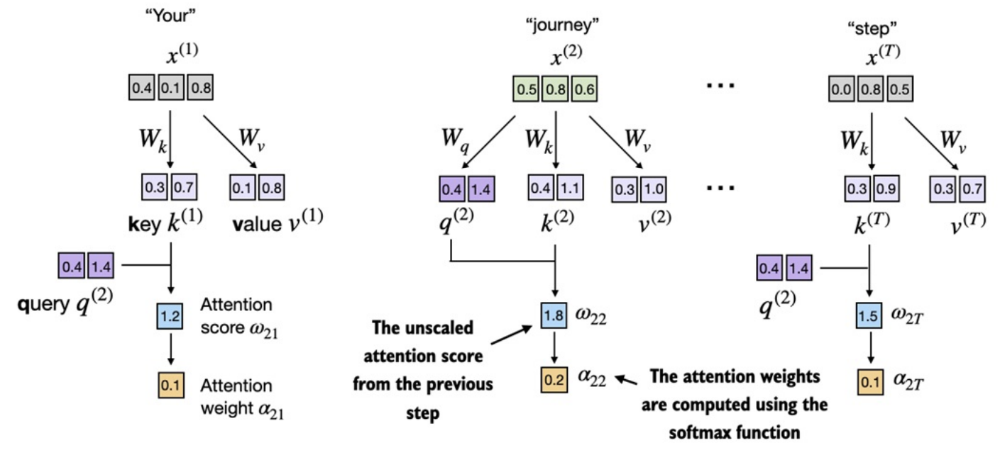

**After computing the attention scores ω, the next step is to normalize these scores
using the softmax function to obtain the attention weights α.**

Previously we compute the attention weights by scaling the attentino scores and using the softmax funtion we used earlier. The difference to earlier is that we now scale the attention scores by dividing them by the square root of the mebedding dimension of the keys

In [71]:
d_k = keys.shape[-1]
attn_weights_2 = torch.softmax(attn_scores_2 / d_k**0.5, dim=-1)
print(attn_weights_2)

tensor([0.1500, 0.2264, 0.2199, 0.1311, 0.0906, 0.1820])


**The rationale behind scaled-dot product attention**

The reason for the normalization by the embedding dimension size is to
improve the training performance by avoiding small gradients. For instance,
when scaling up the embedding dimension, which is typically greater than
thousand for GPT-like LLMs, large dot products can result in very small
gradients during backpropagation due to the softmax function applied to
them. As dot products increase, the softmax function behaves more like a
step function, resulting in gradients nearing zero. These small gradients can
drastically slow down learning or cause training to stagnate.

*Now the final step is to compute the context vectors*

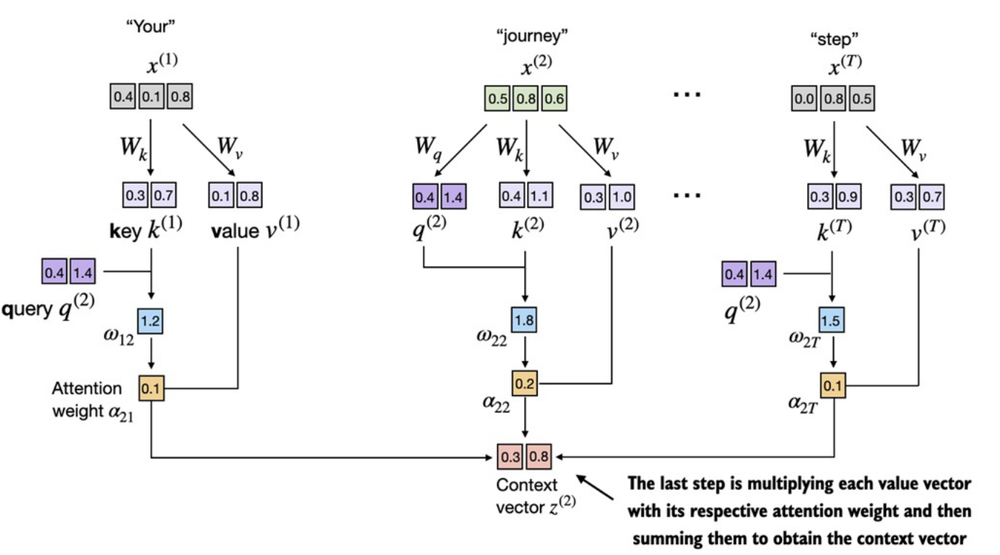

Similar to previous section, where we computed the context vector as a weighted
sum over the input vectors, we now compute the context vector as a weighted
sum over the value vectors. Here, the attention weights serve as a weighting
factor that weighs the respective importance of each value vector. Similar to previous section, we can use matrix multiplication to obtain the output in one step

In [77]:
context_vec_2 = attn_weights_2 @ values
print(context_vec_2)

tensor([0.3061, 0.8210])


So far, we only computed a single context vector, $z^{(2)}$
. In the next section, we
will generalize the code to compute all context vectors in the input sequence,
$z^{(1)}$
to $z^{(T)}$.

**Why query, key, and value**

*The terms "key," "query," and "value" in the context of attention mechanisms
are borrowed from the domain of information retrieval and databases, where
similar concepts are used to store, search, and retrieve information.*

A **"query"** is analogous to a search query in a database. It represents the
current item (e.g., a word or token in a sentence) the model focuses on or
tries to understand. The query is used to probe the other parts of the input
sequence to determine how much attention to pay to them.

The **"key"** is like a database key used for indexing and searching. In the
attention mechanism, each item in the input sequence (e.g., each word in a
sentence) has an associated key. These keys are used to match with the query.

The **"value"** in this context is similar to the value in a key-value pair in a
database. It represents the actual content or representation of the input items.
Once the model determines which keys (and thus which parts of the input)
are most relevant to the query (the current focus item), it retrieves the
corresponding values.

**2.3 Implementing a compact self-attention Python class**

In [80]:
import torch.nn as nn
class SelfAttention_v1(nn.Module):
  def __init__(self, d_in, d_out):
    super().__init__()
    self.d_out = d_out
    self.W_query = nn.Parameter(torch.rand(d_in, d_out))
    self. W_key = nn.Parameter(torch.rand(d_in, d_out))
    self.W_value = nn.Parameter(torch.rand(d_in, d_out))

  def forward(self, x):
    keys = x @ self.W_key
    queries = x @ self.W_query
    values = x @ self.W_value
    attn_scores = queries @ keys.T #omega
    attn_weights = torch.softmax(
        attn_scores / keys.shape[-1]**0.5, dim=-1)
    context_vec = attn_weights @ values
    return context_vec

---------------------------------------------------------------------------------------
During the forward pass, using the forward method, we compute the attention scores(attn_scores) by multiplying queries and keys, normaliszing these scores using softmax. Finally, we create a context vector by weighting the values with these normalized attention scores.

In [81]:
torch.manual_seed(123)
sa_v1 = SelfAttention_v1(d_in, d_out)
print(sa_v1(inputs))

tensor([[0.2996, 0.8053],
        [0.3061, 0.8210],
        [0.3058, 0.8203],
        [0.2948, 0.7939],
        [0.2927, 0.7891],
        [0.2990, 0.8040]], grad_fn=<MmBackward0>)


*As a quick check, notice how the second row `([0.3061, 0.8210])` matches
the contents of context_vec_2 in the previous section.*

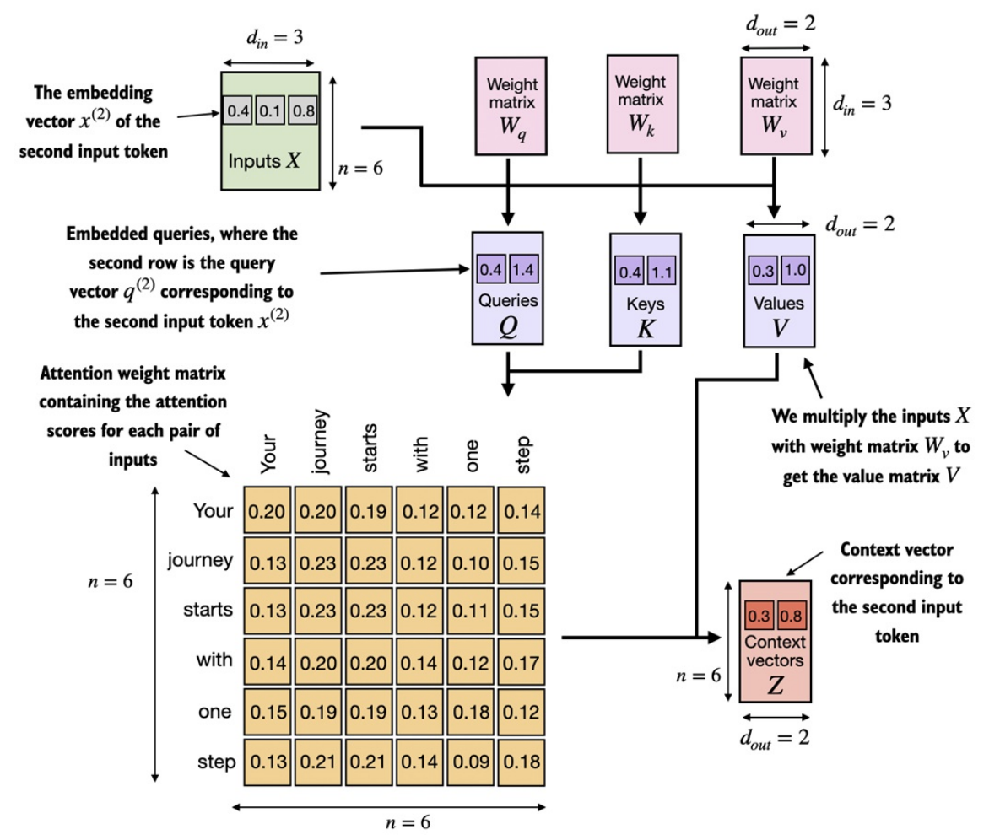

**In self-attention, we transform the input vectors in the input matrix X with the three
weight matrices, Wq, Wk, and Wv. Then, we compute the attention weight matrix based on the
resulting queries (Q) and keys (K). Using the attention weights and values (V), we then compute
the context vectors (Z). (For visual clarity, we focus on a single input text with n tokens in this
figure, not a batch of multiple inputs. Consequently, the 3D input tensor is simplified to a 2D
matrix in this context. This approach allows for a more straightforward visualization and
understanding of the processes involved.)**

--------------------------------------------------------------------------------------
We can improve the SelfAttention_v1 implementation further by utilizing
PyTorch's nn.Linear layers, which effectively perform matrix multiplication
when the bias units are disabled. Additionally, a significant advantage of
using nn.Linear instead of manually implementing
`nn.Parameter(torch.rand(...))` is that `nn.Linear` has an optimized weight
initialization scheme, contributing to more stable and effective model
training

**2.3 A self-attention class using PyTorch's Linear Layers**

In [82]:
class SelfAttention_v2(nn.Module):

    def __init__(self, d_in, d_out, qkv_bias=False):
        super().__init__()
        self.W_query = nn.Linear(d_in, d_out, bias=qkv_bias)
        self.W_key   = nn.Linear(d_in, d_out, bias=qkv_bias)
        self.W_value = nn.Linear(d_in, d_out, bias=qkv_bias)

    def forward(self, x):
        keys = self.W_key(x)
        queries = self.W_query(x)
        values = self.W_value(x)

        attn_scores = queries @ keys.T
        attn_weights = torch.softmax(attn_scores / keys.shape[-1]**0.5, dim=-1)

        context_vec = attn_weights @ values
        return context_vec

torch.manual_seed(789)
sa_v2 = SelfAttention_v2(d_in, d_out)
print(sa_v2(inputs))

tensor([[-0.0739,  0.0713],
        [-0.0748,  0.0703],
        [-0.0749,  0.0702],
        [-0.0760,  0.0685],
        [-0.0763,  0.0679],
        [-0.0754,  0.0693]], grad_fn=<MmBackward0>)


Note that `SelfAttention_v1` and `SelfAttention_v2` give different outputs
because they use different initial weights for the weight matrices since
`nn.Linear` uses a more sophisticated weight initialization scheme.

In the next section, we will make enhancements to the self-attention
mechanism, focusing specifically on incorporating causal and multi-head
elements. The causal aspect involves modifying the attention mechanism to
prevent the model from accessing future information in the sequence, which
is crucial for tasks like language modeling, where each word prediction
should only depend on previous words.


-------------------------------------------------------------------------------------------


The multi-head component involves splitting the attention mechanism into
multiple "heads." Each head learns different aspects of the data, allowing the
model to simultaneously attend to information from different representation
subspaces at different positions. This improves the model's performance in
complex tasks.

-----------------------------------------------------------------------------------------
In the next section, we will make enhancements to the self-attention
mechanism, focusing specifically on incorporating causal and multi-head
elements. The causal aspect involves modifying the attention mechanism to
prevent the model from accessing future information in the sequence, which
is crucial for tasks like language modeling, where each word prediction
should only depend on previous words.

The multi-head component involves splitting the attention mechanism into
multiple "heads." Each head learns different aspects of the data, allowing the
model to simultaneously attend to information from different representation
subspaces at different positions. This improves the model's performance in
complex tasks.

**2.4 Hiding future words with casual attention**

We modify the standard self-attention emchanism to create a *casual attention* mechanism, which is essential for developing an LLM in the subsequent chapters.

**Casual attention**, is also known as *masked attention*, is a specialized form of self-attention. It restricts a model to only consider previoud and current inputs in a sequence when processing any given token. This is in constrast to standard self-attention mechanism, which allows access to entire input sequence at once.

Consequently, when computing attention scores, the causal attention
mechanism ensures that the model only factors in tokens that occur at or
before the current token in the sequence.

To achieve this in GPT-like LLMs, for each token processed, we mask out
the future tokens, which come after the current token in the input text, as
illustrated in Figure

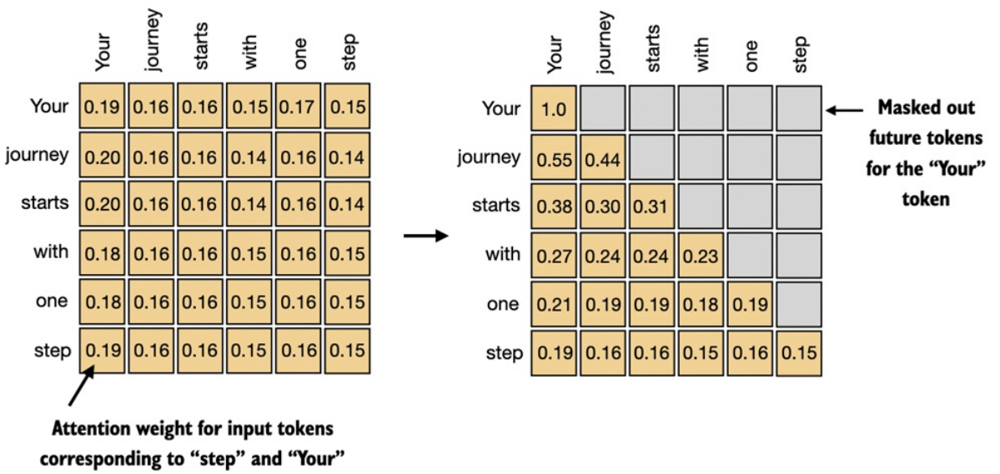

**In causal attention, we mask out the attention weights above the diagonal such that
for a given input, the LLM can't access future tokens when computing the context vectors using
the attention weights. For example, for the word "journey" in the second row, we only keep the
attention weights for the words before ("Your") and in the current position ("journey").**

**2.4.1 Applying a casual attention mask**

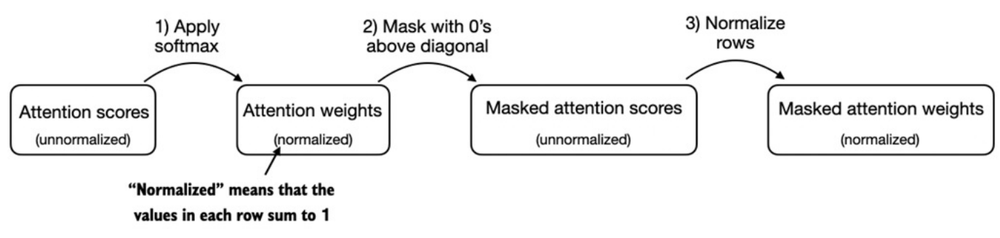

**One way to obtain the masked attention weight matrix in causal attention is to apply
the softmax function to the attention scores, zeroing out the elements above the diagonal and
normalizing the resulting matrix.**

In [88]:
# Reuse the query and key weight matrices of the
# SelfAttention_v2 object from the previous section for convenience
queries = sa_v2.W_query(inputs)
keys = sa_v2.W_key(inputs)
attn_scores = queries @ keys.T

attn_weights = torch.softmax(attn_scores / keys.shape[-1]**0.5, dim=-1)
print(attn_weights)

tensor([[0.1921, 0.1646, 0.1652, 0.1550, 0.1721, 0.1510],
        [0.2041, 0.1659, 0.1662, 0.1496, 0.1665, 0.1477],
        [0.2036, 0.1659, 0.1662, 0.1498, 0.1664, 0.1480],
        [0.1869, 0.1667, 0.1668, 0.1571, 0.1661, 0.1564],
        [0.1830, 0.1669, 0.1670, 0.1588, 0.1658, 0.1585],
        [0.1935, 0.1663, 0.1666, 0.1542, 0.1666, 0.1529]],
       grad_fn=<SoftmaxBackward0>)


*  The simplest way to mask out future attention weights is by creating a mask via PyTorch's tril function with elements below the main diagonal (including the diagonal itself) set to 1 and above the main diagonal set to 0:

In [89]:
context_length = attn_scores.shape[0]
mask_simple = torch.tril(torch.ones(context_length, context_length))
print(mask_simple)

tensor([[1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0.],
        [1., 1., 1., 0., 0., 0.],
        [1., 1., 1., 1., 0., 0.],
        [1., 1., 1., 1., 1., 0.],
        [1., 1., 1., 1., 1., 1.]])


Now we can multiply this mask with the attention weights to zero out the values above the diagonal:

In [90]:
masked_simple = attn_weights * mask_simple
print(masked_simple)

tensor([[0.1921, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.2041, 0.1659, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.2036, 0.1659, 0.1662, 0.0000, 0.0000, 0.0000],
        [0.1869, 0.1667, 0.1668, 0.1571, 0.0000, 0.0000],
        [0.1830, 0.1669, 0.1670, 0.1588, 0.1658, 0.0000],
        [0.1935, 0.1663, 0.1666, 0.1542, 0.1666, 0.1529]],
       grad_fn=<MulBackward0>)


In [92]:
row_sums = masked_simple.sum(dim=1, keepdim=True)
masked_simple_norm = masked_simple / row_sums  # Normalize the rows
print(masked_simple_norm)

tensor([[1.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.5517, 0.4483, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.3800, 0.3097, 0.3103, 0.0000, 0.0000, 0.0000],
        [0.2758, 0.2460, 0.2462, 0.2319, 0.0000, 0.0000],
        [0.2175, 0.1983, 0.1984, 0.1888, 0.1971, 0.0000],
        [0.1935, 0.1663, 0.1666, 0.1542, 0.1666, 0.1529]],
       grad_fn=<DivBackward0>)


**A more efficient way to obtain the masked attention weight matrix in causal attention
is to mask the attention scores with negative infinity values before applying the softmax function.**

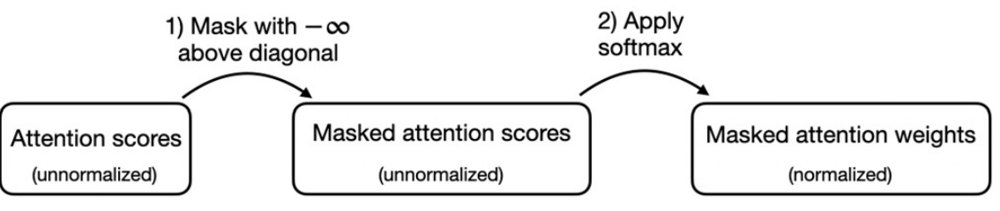

The softmax function converts its inputs into a probability distribution. When
negative infinity values (-∞) are present in a row, the softmax function treats
them as zero probability. (Mathematically, this is because $e^{-∞}$ approaches 0.)
We can implement this more efficient masking "trick" by creating a mask
with 1's above the diagonal and then replacing these 1's with negative infinity
(-inf) values:

In [93]:
mask = torch.triu(torch.ones(context_length, context_length), diagonal=1)
masked = attn_scores.masked_fill(mask.bool(), -torch.inf)
print(masked)

tensor([[0.2899,   -inf,   -inf,   -inf,   -inf,   -inf],
        [0.4656, 0.1723,   -inf,   -inf,   -inf,   -inf],
        [0.4594, 0.1703, 0.1731,   -inf,   -inf,   -inf],
        [0.2642, 0.1024, 0.1036, 0.0186,   -inf,   -inf],
        [0.2183, 0.0874, 0.0882, 0.0177, 0.0786,   -inf],
        [0.3408, 0.1270, 0.1290, 0.0198, 0.1290, 0.0078]],
       grad_fn=<MaskedFillBackward0>)


Now we need to apply the softmax funtion to these masked results, and it's done

In [94]:
attn_weights = torch.softmax(masked / keys.shape[-1]**0.5, dim=1)
print(attn_weights)

tensor([[1.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.5517, 0.4483, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.3800, 0.3097, 0.3103, 0.0000, 0.0000, 0.0000],
        [0.2758, 0.2460, 0.2462, 0.2319, 0.0000, 0.0000],
        [0.2175, 0.1983, 0.1984, 0.1888, 0.1971, 0.0000],
        [0.1935, 0.1663, 0.1666, 0.1542, 0.1666, 0.1529]],
       grad_fn=<SoftmaxBackward0>)


We could now use the modified attention weights to compute the context
vectors via `context_vec = attn_weights @ values`, as in previous section.
However, in the next section, we first cover another minor tweak to the
causal attention mechanism that is useful for reducing overfitting when
training LLMs.

**2.4.2 Masking additional attention weights with dropout**

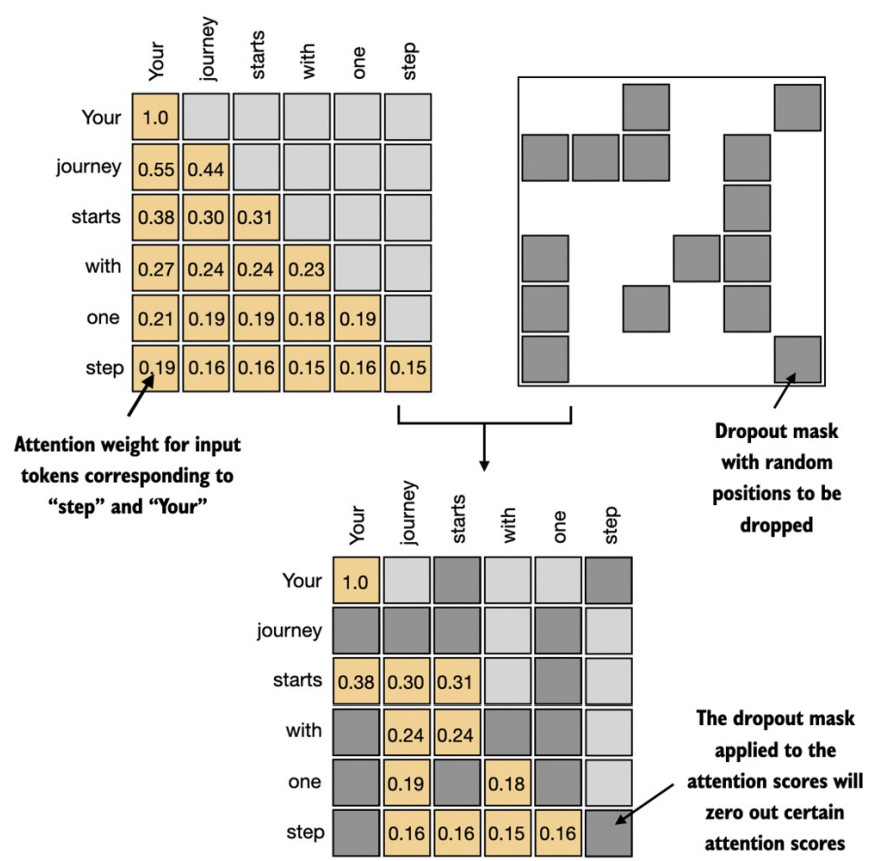

**Using the causal attention mask (upper left), we apply an additional dropout mask
(upper right) to zero out additional attention weights to reduce overfitting during training.**

In the following code example, we use a dropout rate of 50%, which means
masking out half of the attention weights. (When we train the GPT model in
later chapters, we will use a lower dropout rate, such as 0.1 or 0.2.)

In the folowing code, we apply droupout to a 6X6 tensor consisting of ones for illustration

In [96]:
torch.manual_seed(123)
dropout = torch.nn.Dropout(0.5) #A
example = torch.ones(6,6) #B
print(dropout(example))

tensor([[2., 2., 2., 2., 2., 2.],
        [0., 2., 0., 0., 0., 0.],
        [0., 0., 2., 0., 2., 0.],
        [2., 2., 0., 0., 0., 2.],
        [2., 0., 0., 0., 0., 2.],
        [0., 2., 0., 0., 0., 0.]])


When applying dropout to an attention weight matrix with a rate of 50%, half
of the elements in the matrix are randomly set to zero. To compensate for the
reduction in active elements, the values of the remaining elements in the
matrix are scaled up by a factor of 1/0.5 =2. This scaling is crucial to
maintain the overall balance of the attention weights, ensuring that the
average influence of the attention mechanism remains consistent during both
the training and inference phases.

Now, let's apply dropout to the attention weight matrix itself:

In [97]:
torch.manual_seed(123)
print(dropout(attn_weights))

tensor([[2.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.8966, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.6206, 0.0000, 0.0000, 0.0000],
        [0.5517, 0.4921, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.4350, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.3327, 0.0000, 0.0000, 0.0000, 0.0000]],
       grad_fn=<MulBackward0>)


**2.5 Implementing a compact casual attention class**

This class will then serve as a template for developing multi-head
attention in the upcoming section, which is the final attention class we
implement in this chapter.

But before we begin, one more thing is to ensure that the code can handle
batches consisting of more than one input so that the CausalAttention class
supports the batch outputs produced by the data loader we implemented in previous chapter.

For simplicity, to simulate such batch inputs, we duplicate the input text
example:

In [98]:
batch = torch.stack((inputs,inputs), dim=0)
print(batch.shape)

torch.Size([2, 6, 3])


The following CausalAttention class is similar to the SelfAttention class
we implemented earlier, except that we now added the dropout and causal
mask components as highlighted in the following code:

In [99]:
class CausalAttention(nn.Module):

    def __init__(self, d_in, d_out, context_length,
                 dropout, qkv_bias=False):
        super().__init__()
        self.d_out = d_out
        self.W_query = nn.Linear(d_in, d_out, bias=qkv_bias)
        self.W_key   = nn.Linear(d_in, d_out, bias=qkv_bias)
        self.W_value = nn.Linear(d_in, d_out, bias=qkv_bias)
        self.dropout = nn.Dropout(dropout) # New
        self.register_buffer('mask', torch.triu(torch.ones(context_length, context_length), diagonal=1)) # New

    def forward(self, x):
        b, num_tokens, d_in = x.shape # New batch dimension b
        keys = self.W_key(x)
        queries = self.W_query(x)
        values = self.W_value(x)

        attn_scores = queries @ keys.transpose(1, 2) # Changed transpose
        attn_scores.masked_fill_(  # New, _ ops are in-place
            self.mask.bool()[:num_tokens, :num_tokens], -torch.inf)  # `:num_tokens` to account for cases where the number of tokens in the batch is smaller than the supported context_size
        attn_weights = torch.softmax(
            attn_scores / keys.shape[-1]**0.5, dim=-1
        )
        attn_weights = self.dropout(attn_weights) # New

        context_vec = attn_weights @ values
        return context_vec

torch.manual_seed(123)

context_length = batch.shape[1]
ca = CausalAttention(d_in, d_out, context_length, 0.0)

context_vecs = ca(batch)

print(context_vecs)
print("context_vecs.shape:", context_vecs.shape)

tensor([[[-0.4519,  0.2216],
         [-0.5874,  0.0058],
         [-0.6300, -0.0632],
         [-0.5675, -0.0843],
         [-0.5526, -0.0981],
         [-0.5299, -0.1081]],

        [[-0.4519,  0.2216],
         [-0.5874,  0.0058],
         [-0.6300, -0.0632],
         [-0.5675, -0.0843],
         [-0.5526, -0.0981],
         [-0.5299, -0.1081]]], grad_fn=<UnsafeViewBackward0>)
context_vecs.shape: torch.Size([2, 6, 2])


We can use the CausalAttention class as follows, similar to SelfAttention
previously:

In [100]:
torch.manual_seed(123)
context_length = batch.shape[1]
ca = CausalAttention(d_in, d_out, context_length, 0.0)
context_vecs = ca(batch)
print("context_vecs.shape:", context_vecs.shape)

context_vecs.shape: torch.Size([2, 6, 2])


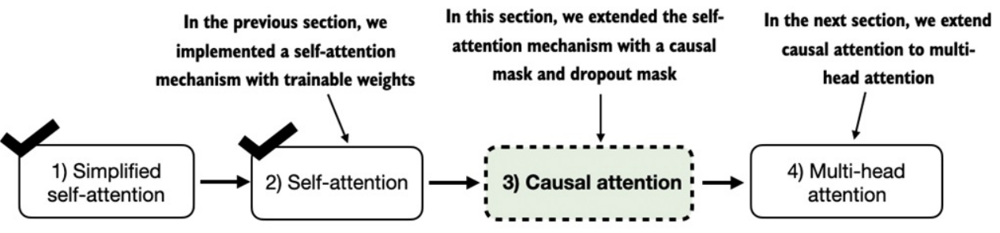

**A mental model summarizing the four different attention modules we are coding in
this chapter. We began with a simplified attention mechanism, added trainable weights, and then
added a casual attention mask. In the remainder of this chapter, we will extend the causal
attention mechanism and code multi-head attention, which is the final module we will use in the
LLM implementation in the next chapter.**

**2.6 Stacking multiple single-head attention layers**

The term "multi-head" refers to dividing the attention mechanism into
multiple "heads," each operating independently. In this context, a single
causal attention module can be considered single-head attention, where there
is only one set of attention weights processing the input sequentially.


In the following subsections, we will tackle this expansion from causal
attention to multi-head attention. The first subsection will intuitively build a
multi-head attention module by stacking multiple CausalAttention modules
for illustration purposes. The second subsection will then implement the same
multi-head attention module in a more complicated but computationally more
efficient way.

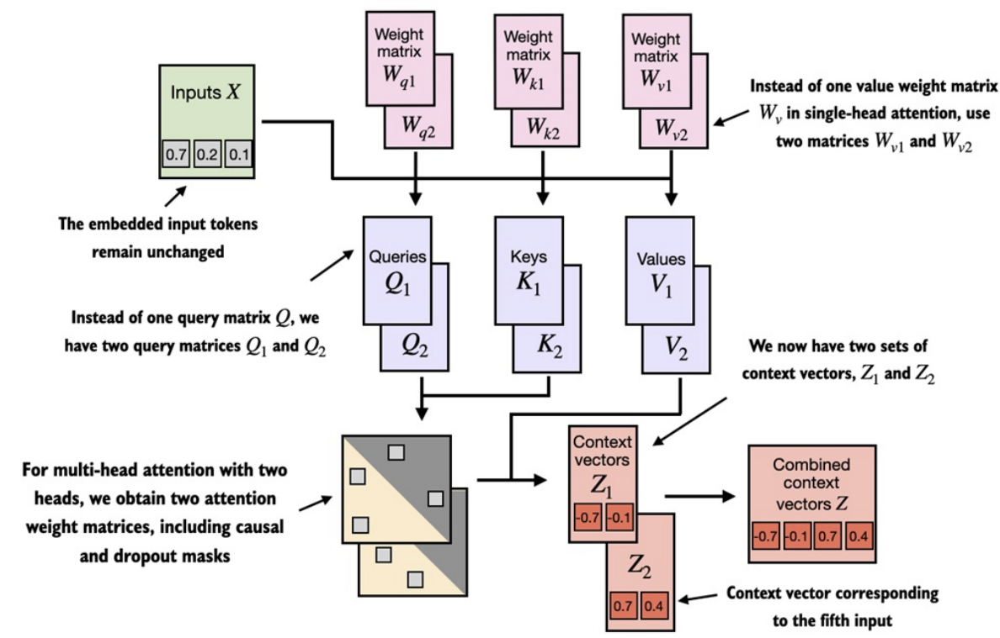

**The multi-head attention module in this figure depicts two single-head attention
modules stacked on top of each other. So, instead of using a single matrix $W_{v}$
for computing the
value matrices, in a multi-head attention module with two heads, we now have two value weight
matrices: $W_{v1}$
and $W_{v2}$
. The same applies to the other weight matrices, Wq and Wk. We obtain
two sets of context vectors $Z_{1}$
and $Z_{2}$
that we can combine into a single context vector matrix Z.**

As mentioned before, the main idea behind multi-head attention is to run the
attention mechanism multiple times (in parallel) with different, learned linear
projections -- the results of multiplying the input data (like the query, key,
and value vectors in attention mechanisms) by a weight matrix.

In [101]:
class MultiHeadAttentionWrapper(nn.Module):

    def __init__(self, d_in, d_out, context_length, dropout, num_heads, qkv_bias=False):
        super().__init__()
        self.heads = nn.ModuleList(
            [CausalAttention(d_in, d_out, context_length, dropout, qkv_bias)
             for _ in range(num_heads)]
        )

    def forward(self, x):
        return torch.cat([head(x) for head in self.heads], dim=-1)


torch.manual_seed(123)

context_length = batch.shape[1] # This is the number of tokens
d_in, d_out = 3, 2
mha = MultiHeadAttentionWrapper(
    d_in, d_out, context_length, 0.0, num_heads=2
)

context_vecs = mha(batch)

print(context_vecs)
print("context_vecs.shape:", context_vecs.shape)

tensor([[[-0.4519,  0.2216,  0.4772,  0.1063],
         [-0.5874,  0.0058,  0.5891,  0.3257],
         [-0.6300, -0.0632,  0.6202,  0.3860],
         [-0.5675, -0.0843,  0.5478,  0.3589],
         [-0.5526, -0.0981,  0.5321,  0.3428],
         [-0.5299, -0.1081,  0.5077,  0.3493]],

        [[-0.4519,  0.2216,  0.4772,  0.1063],
         [-0.5874,  0.0058,  0.5891,  0.3257],
         [-0.6300, -0.0632,  0.6202,  0.3860],
         [-0.5675, -0.0843,  0.5478,  0.3589],
         [-0.5526, -0.0981,  0.5321,  0.3428],
         [-0.5299, -0.1081,  0.5077,  0.3493]]], grad_fn=<CatBackward0>)
context_vecs.shape: torch.Size([2, 6, 4])


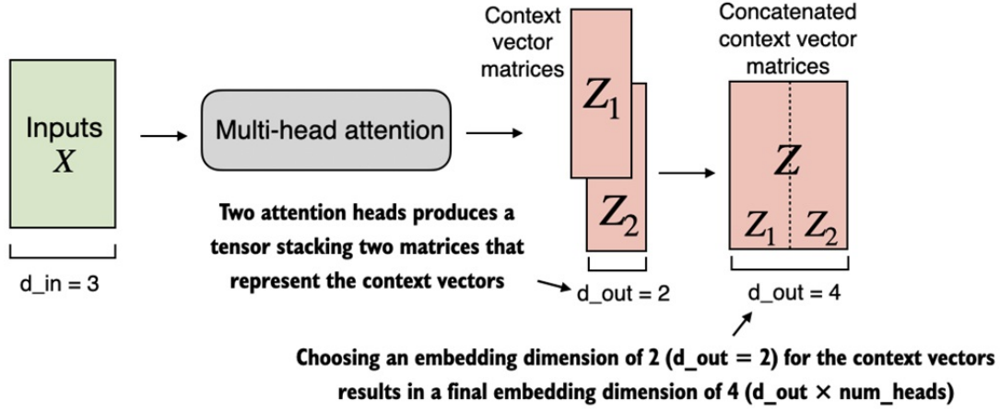

**Using the MultiHeadAttentionWrapper, we specified the number of attention heads
(num_heads). If we set num_heads=2, as shown in this figure, we obtain a tensor with two sets of
context vector matrices. In each context vector matrix, the rows represent the context vectors
corresponding to the tokens, and the columns correspond to the embedding dimension specified
via d_out=4. We concatenate these context vector matrices along the column dimension. Since we
have 2 attention heads and an embedding dimension of 2, the final embedding dimension is 2 × 2
= 4.**

**2.7 Implementing multi-head attention with weight splits**

*  While the above is an intuitive and fully functional implementation of
   multi-head attention (wrapping the single-head attention `CausalAttention` implementation from earlier), we can write a stand-alone class called `MultiHeadAttention` to achieve the same

*  We don't concatenate single attention heads for this stand-alone
   `MultiHeadAttention` class

*  Instead, we create single W_query, W_key, and W_value weight matrices and
   then split those into individual matrices for each attention head:

*The first dimension of the resulting context_vecs tensor is 2 since we have
two input texts (the input texts are duplicated, which is why the context
vectors are exactly the same for those). The second dimension refers to the 6
tokens in each input. The third dimension refers to the 4-dimensional
embedding of each token.*

In [102]:
class MultiHeadAttention(nn.Module):
    def __init__(self, d_in, d_out, context_length, dropout, num_heads, qkv_bias=False):
        super().__init__()
        assert (d_out % num_heads == 0), \
            "d_out must be divisible by num_heads"

        self.d_out = d_out
        self.num_heads = num_heads
        self.head_dim = d_out // num_heads # Reduce the projection dim to match desired output dim

        self.W_query = nn.Linear(d_in, d_out, bias=qkv_bias)
        self.W_key = nn.Linear(d_in, d_out, bias=qkv_bias)
        self.W_value = nn.Linear(d_in, d_out, bias=qkv_bias)
        self.out_proj = nn.Linear(d_out, d_out)  # Linear layer to combine head outputs
        self.dropout = nn.Dropout(dropout)
        self.register_buffer(
            "mask",
            torch.triu(torch.ones(context_length, context_length),
                       diagonal=1)
        )

    def forward(self, x):
        b, num_tokens, d_in = x.shape

        keys = self.W_key(x) # Shape: (b, num_tokens, d_out)
        queries = self.W_query(x)
        values = self.W_value(x)

        # We implicitly split the matrix by adding a `num_heads` dimension
        # Unroll last dim: (b, num_tokens, d_out) -> (b, num_tokens, num_heads, head_dim)
        keys = keys.view(b, num_tokens, self.num_heads, self.head_dim)
        values = values.view(b, num_tokens, self.num_heads, self.head_dim)
        queries = queries.view(b, num_tokens, self.num_heads, self.head_dim)

        # Transpose: (b, num_tokens, num_heads, head_dim) -> (b, num_heads, num_tokens, head_dim)
        keys = keys.transpose(1, 2)
        queries = queries.transpose(1, 2)
        values = values.transpose(1, 2)

        # Compute scaled dot-product attention (aka self-attention) with a causal mask
        attn_scores = queries @ keys.transpose(2, 3)  # Dot product for each head

        # Original mask truncated to the number of tokens and converted to boolean
        mask_bool = self.mask.bool()[:num_tokens, :num_tokens]

        # Use the mask to fill attention scores
        attn_scores.masked_fill_(mask_bool, -torch.inf)

        attn_weights = torch.softmax(attn_scores / keys.shape[-1]**0.5, dim=-1)
        attn_weights = self.dropout(attn_weights)

        # Shape: (b, num_tokens, num_heads, head_dim)
        context_vec = (attn_weights @ values).transpose(1, 2)

        # Combine heads, where self.d_out = self.num_heads * self.head_dim
        context_vec = context_vec.contiguous().view(b, num_tokens, self.d_out)
        context_vec = self.out_proj(context_vec) # optional projection

        return context_vec

torch.manual_seed(123)

batch_size, context_length, d_in = batch.shape
d_out = 2
mha = MultiHeadAttention(d_in, d_out, context_length, 0.0, num_heads=2)

context_vecs = mha(batch)

print(context_vecs)
print("context_vecs.shape:", context_vecs.shape)

tensor([[[0.3190, 0.4858],
         [0.2943, 0.3897],
         [0.2856, 0.3593],
         [0.2693, 0.3873],
         [0.2639, 0.3928],
         [0.2575, 0.4028]],

        [[0.3190, 0.4858],
         [0.2943, 0.3897],
         [0.2856, 0.3593],
         [0.2693, 0.3873],
         [0.2639, 0.3928],
         [0.2575, 0.4028]]], grad_fn=<ViewBackward0>)
context_vecs.shape: torch.Size([2, 6, 2])


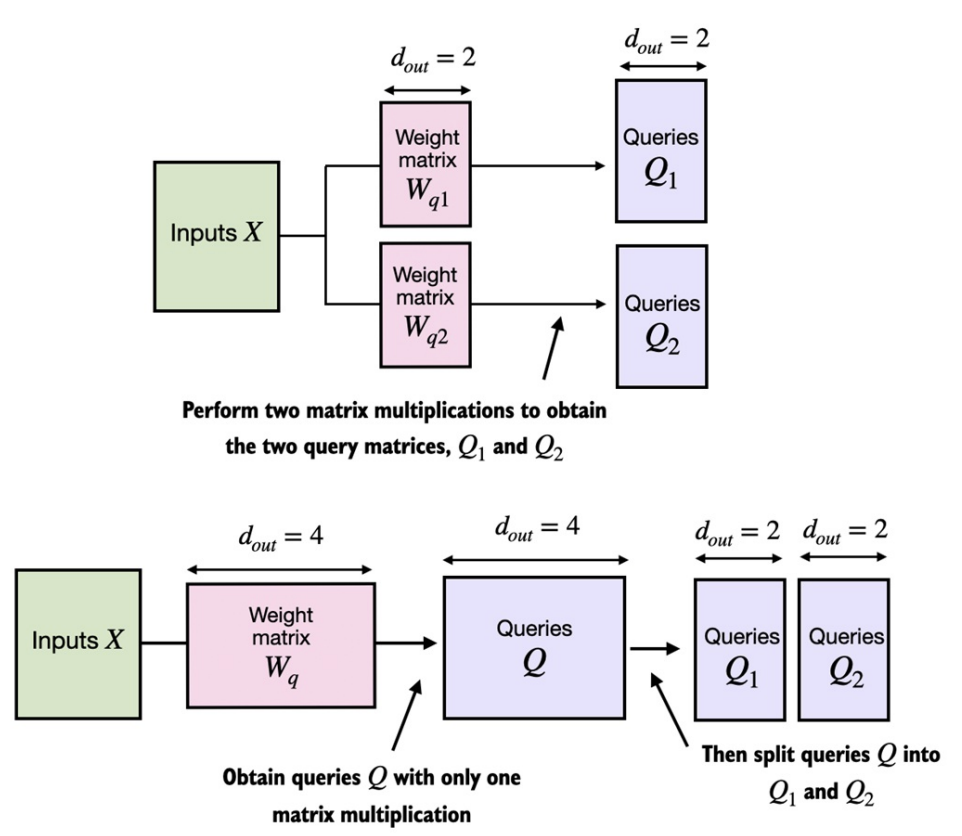

**In the MultiheadAttentionWrapper class with two attention heads, we initialized two
weight matrices Wq1
and Wq2
and computed two query matrices Q1
and Q2
as illustrated at the
top of this figure. In the MultiheadAttention class, we initialize one larger weight matrix Wq ,
only perform one matrix multiplication with the inputs to obtain a query matrix Q, and then split
the query matrix into Q1
and Q2
as shown at the bottom of this figure. We do the same for the
keys and values, which are not shown to reduce visual clutter.**

The splitting of the query, key, and value tensors, as depicted in Figure 3.26,
is achieved through tensor reshaping and transposing operations using
PyTorch's .view and .transpose methods. The input is first transformed (via
linear layers for queries, keys, and values) and then reshaped to represent
multiple heads

*   Note that the above is essentially a rewritten version of
    `MultiHeadAttentionWrapper` that is more efficient

*   The resulting output looks a bit different since the random weight
    initializations differ, but both are fully functional implementations that can be used in the GPT class we will implement in the upcoming chapters

*   Note that in addition, we added a linear projection layer `(self.out_proj)`
    to the `MultiHeadAttention` class above. This is simply a linear transformation that doesn't change the dimensions. It's a standard convention to use such a projection layer in LLM implementation, but it's not strictly necessary (recent research has shown that it can be removed without affecting the modeling performance; see the further reading section at the end of this chapter)

*  Note that if you are interested in a compact and efficient implementation of
   the above, you can also consider the `torch.nn.MultiheadAttention` class in PyTorch

*  Since the above implementation may look a bit complex at first glance, let's
   look at what happens when executing `attn_scores = queries @ keys.transpose(2, 3)`:

In [103]:
# (b, num_heads, num_tokens, head_dim) = (1, 2, 3, 4)
a = torch.tensor([[[[0.2745, 0.6584, 0.2775, 0.8573],
                    [0.8993, 0.0390, 0.9268, 0.7388],
                    [0.7179, 0.7058, 0.9156, 0.4340]],

                   [[0.0772, 0.3565, 0.1479, 0.5331],
                    [0.4066, 0.2318, 0.4545, 0.9737],
                    [0.4606, 0.5159, 0.4220, 0.5786]]]])

print(a @ a.transpose(2, 3))

tensor([[[[1.3208, 1.1631, 1.2879],
          [1.1631, 2.2150, 1.8424],
          [1.2879, 1.8424, 2.0402]],

         [[0.4391, 0.7003, 0.5903],
          [0.7003, 1.3737, 1.0620],
          [0.5903, 1.0620, 0.9912]]]])


*  In this case, the matrix multiplication implementation in PyTorch will
   handle the 4-dimensional input tensor so that the matrix multiplication is carried out between the 2 last dimensions (num_tokens, head_dim) and then repeated for the individual heads

*  For instance, the following becomes a more compact way to compute the matrix
   multiplication for each head separately:

In [104]:
first_head = a[0, 0, :, :]
first_res = first_head @ first_head.T
print("First head:\n", first_res)

second_head = a[0, 1, :, :]
second_res = second_head @ second_head.T
print("\nSecond head:\n", second_res)

First head:
 tensor([[1.3208, 1.1631, 1.2879],
        [1.1631, 2.2150, 1.8424],
        [1.2879, 1.8424, 2.0402]])

Second head:
 tensor([[0.4391, 0.7003, 0.5903],
        [0.7003, 1.3737, 1.0620],
        [0.5903, 1.0620, 0.9912]])
